## Preparation

In [1]:
!pip install bertopic sentence-transformers umap-learn hdbscan plotly adjustText tiktoken

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 79.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu

In [2]:
!pip install -U sentence-transformers transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.7/345.7 kB 16.7 MB/s eta 0:00:00
  Attempting uninstall: sentence-transformers
    Found existing installation: sentence-transformers 3.4.1
    Uninstalling sentence-transformers-3.4.1:
      Successfully uninstalled sentence-transformers-3.4.1


In [3]:
import numpy as np
import pandas as pd
import json
import re
import matplotlib.pyplot as plt
import pickle

In [4]:
from google.colab  import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Fetch files

In [5]:
file_path = '/content/drive/My Drive/asr_paper_clean_texts.json'
with open(file_path, 'r', encoding='utf-8') as f:
    asr_paper_texts = json.load(f)

In [6]:
file_path = '/content/drive/My Drive/asr_doi_issue.json'
with open(file_path, "r") as f:
    asr_doi_issue_dict = json.load(f)

In [7]:
file_path = '/content/drive/My Drive/ajs_paper_clean_texts.json'
with open(file_path, 'r', encoding='utf-8') as f:
    ajs_paper_texts = json.load(f)

In [8]:
file_path = '/content/drive/My Drive/ajs_doi_issue.json'
with open(file_path, "r") as f:
    ajs_doi_issue_dict = json.load(f)

In [9]:
pkl_file_path = "/content/drive/My Drive/asr_paper_gemini_embeddings.pkl"

with open(pkl_file_path, 'rb') as f:
    asr_paper_gemini_embeddings = pickle.load(f)

In [10]:
pkl_file_path = "/content/drive/My Drive/ajs_paper_gemini_embeddings.pkl"

with open(pkl_file_path, 'rb') as f:
    ajs_paper_gemini_embeddings = pickle.load(f)

In [11]:
len(asr_paper_texts)

4181

In [12]:
len(ajs_paper_texts)

5703

### Gemini embeddings

In [12]:
ajs_dois_valid = []
for doi, issue in ajs_doi_issue_dict.items():
    try:
        year = int(issue.split('(')[0]) + 1894
        if year >= 1940 and year <= 2020:
            ajs_dois_valid.append(doi)
    except ValueError:
        print(f"Invalid doi: {doi}")

Invalid doi: 10.1086/734909
Invalid doi: 10.1086/734377
Invalid doi: 10.1086/733799
Invalid doi: 10.1086/733783
Invalid doi: 10.1086/733928
Invalid doi: 10.1086/734296


In [13]:
ajs_paper_texts_filtered = {}
for doi, text in ajs_paper_texts.items():
    if doi in ajs_dois_valid:
        ajs_paper_texts_filtered[doi] = text

In [14]:
len(ajs_paper_texts_filtered)

3650

**Trial**

In [15]:
text = [value for key, value in asr_paper_texts.items()][0]

In [16]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
import tiktoken

def chunk_text_gemini(text, max_tokens=7950, overlap_ratio=0.05):

    encoding = tiktoken.get_encoding("cl100k_base")

    def token_count(text):
        return len(encoding.encode(text))

    splitter = RecursiveCharacterTextSplitter(
        chunk_size=max_tokens,
        chunk_overlap=int(max_tokens * overlap_ratio),
        length_function=token_count,
        separators=["\n", ".", ";", ",", " ", ""],
        keep_separator=True
    )

    return splitter.split_text(text)

In [17]:
from google import genai

client = genai.Client(api_key="API_KEY")

def get_doc_embeddings_gemini(text):
    chunks = chunk_text_gemini(text)
    embeddings = []

    for chunk in chunks:
        result = client.models.embed_content(
            model="gemini-embedding-exp-03-07",
            contents=chunk)
        embeddings.append(result.embeddings)

    return embeddings

In [18]:
trial = get_doc_embeddings_gemini(text)

In [18]:
trial

[[ContentEmbedding(values=[0.017283114, -0.0055094603, 0.029349757, -0.026343107, -0.019196449, -0.029459681, 0.0145805245, 0.01954435, -0.008560916, 0.00063567125, 0.002659942, 0.017406054, 0.019356417, -0.0069541116, 0.10411757, -0.0011637933, 0.01832932, -0.0069112834, 0.017629739, 0.025625236, 0.0019542326, -0.0056010704, 0.017037481, -0.0055495594, -0.0025960943, -0.03311611, 0.008203007, -0.022849197, 0.020121457, -0.0067477264, -0.009900732, 0.0020178608, 0.013239758, 0.007028681, 0.0058984794, 0.010360939, 0.0007123398, 0.001453741, 0.0017353665, 0.010556802, 0.0043829787, 0.020770904, -0.014355059, 0.016819842, 0.024307404, 0.018376047, 0.026404528, -0.016228268, -0.022389557, -0.0058043157, -0.019482743, -0.010889046, -0.028142814, -0.1793587, -0.006470051, -0.020328905, -0.019033106, -0.017778011, -0.023037141, -0.0036167686, 0.008859128, 0.017906254, -0.0044470653, -0.02383189, 0.008620961, -0.044279367, -0.0026951402, 0.012557986, -0.013082743, 0.00069609185, 0.005364171, 

**Turning texts into gemini embeddings**

In [19]:
from langchain.text_splitter import RecursiveCharacterTextSplitter
import tiktoken
import time
import random
import pickle
import os
from datetime import datetime
from tenacity import retry, wait_exponential, stop_after_attempt, retry_if_exception_type
from google import genai
from google.genai.errors import ClientError, ServerError
import tqdm

CHECKPOINT_FILE = "embedding_checkpoint.pkl"
LOG_FILE = "embedding_process.log"

client = genai.Client(api_key="API_KEY")

def log_message(message):
    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    log_entry = f"[{timestamp}] {message}"
    print(log_entry)

    with open(LOG_FILE, "a") as f:
        f.write(log_entry + "\n")

def chunk_text_gemini(text, max_tokens=7950, overlap_ratio=0.05):
    encoding = tiktoken.get_encoding("cl100k_base")

    def token_count(text):
        return len(encoding.encode(text))

    splitter = RecursiveCharacterTextSplitter(
        chunk_size=max_tokens,
        chunk_overlap=int(max_tokens * overlap_ratio),
        length_function=token_count,
        separators=["\n", ".", ";", ",", " ", ""],
        keep_separator=True
    )

    return splitter.split_text(text)

@retry(
    retry=retry_if_exception_type(ClientError),
    wait=wait_exponential(multiplier=1, min=4, max=120),
    stop=stop_after_attempt(7)
)
def batch_embed_chunks(chunks, batch_size=10):
    all_embeddings = []
    total_batches = (len(chunks) + batch_size - 1) // batch_size

    for i in range(0, len(chunks), batch_size):
        batch = chunks[i:i+batch_size]
        batch_num = i // batch_size + 1

        try:
            time.sleep(random.uniform(1.0, 2.0))
            requests = [{"text": chunk} for chunk in batch]

            try:
                results = client.models.embed_content(
                    model="gemini-embedding-exp-03-07",
                    contents=batch
                )
                batch_embeddings = results.embeddings
            except AttributeError:
                log_message("Batch embedding not supported, falling back to individual requests")
                batch_embeddings = []
                for chunk in batch:
                    time.sleep(random.uniform(0.5, 1.0))
                    result = client.models.embed_content(
                        model="gemini-embedding-exp-03-07",
                        contents=chunk
                    )
                    batch_embeddings.append(result.embeddings)

            all_embeddings.extend(batch_embeddings)
            log_message(f"Processed batch {batch_num}/{total_batches}")

        except ClientError as e:
            if e.status_code == 429:
                log_message(f"Rate limit hit, backing off... ({e})")
                raise e
            else:
                log_message(f"Client error: {e}")
                raise e

    return all_embeddings

def get_doc_embeddings_gemini(text):
    chunks = chunk_text_gemini(text)
    log_message(f"Document split into {len(chunks)} chunks")
    batch_size = 10

    if len(chunks) > 100:
        batch_size = 20
    elif len(chunks) < 5:
        batch_size = len(chunks)

    return batch_embed_chunks(chunks, batch_size=batch_size)

def save_checkpoint(embedding_dict, processed_count):
    with open(CHECKPOINT_FILE, "wb") as f:
        pickle.dump(embedding_dict, f)
    log_message(f"Checkpoint saved: {processed_count}/{total_docs} documents ({processed_count/total_docs*100:.1f}% complete)")

def load_checkpoint():
    if os.path.exists(CHECKPOINT_FILE):
        with open(CHECKPOINT_FILE, "rb") as f:
            embedding_dict = pickle.load(f)
        log_message(f"Checkpoint loaded with {len(embedding_dict)} documents")
        return embedding_dict
    return {}

def text_embeddings_gemini(paper_texts_dic):
    global total_docs
    total_docs = len(paper_texts_dic)
    embedding_dict = load_checkpoint()

    remaining_docs = {k: v for k, v in paper_texts_dic.items() if k not in embedding_dict}

    if not remaining_docs:
        log_message("All documents already processed!")
        return embedding_dict

    log_message(f"Starting processing of {len(remaining_docs)} remaining documents out of {total_docs} total")

    try:
        doc_items = list(remaining_docs.items())

        for idx, (doi, text) in enumerate(doc_items):
            processed_count = len(embedding_dict)
            progress_pct = processed_count / total_docs * 100

            log_message(f"Processing document {idx+1}/{len(remaining_docs)} (Overall: {processed_count}/{total_docs}, {progress_pct:.1f}%): {doi}")

            try:
                embeddings = get_doc_embeddings_gemini(text)
                embedding_dict[doi] = embeddings

                if (idx + 1) % 10 == 0 or (idx + 1) == len(remaining_docs):
                    save_checkpoint(embedding_dict, len(embedding_dict))

                if idx % 50 == 0 and idx > 0:
                    pause_time = random.uniform(15, 30)
                    log_message(f"Taking a longer break after 50 documents: {pause_time:.1f}s")
                else:
                    pause_time = random.uniform(1, 3)

                log_message(f"Completed document {idx+1}/{len(remaining_docs)}. Pausing for {pause_time:.1f}s")
                time.sleep(pause_time)

            except Exception as e:
                log_message(f"Failed to process document {doi}: {e}")
                save_checkpoint(embedding_dict, len(embedding_dict))
                time.sleep(20)

    except KeyboardInterrupt:
        log_message("Process interrupted manually. Progress saved.")
        save_checkpoint(embedding_dict, len(embedding_dict))
    except Exception as e:
        log_message(f"Unexpected error in main processing loop: {e}")
        save_checkpoint(embedding_dict, len(embedding_dict))

    log_message(f"Processing complete. Total documents: {len(embedding_dict)}/{total_docs}")
    return embedding_dict

log_message("Starting embedding process for 4000 documents")

[2025-04-26 23:18:26] Starting embedding process for 4000 documents


In [ ]:
asr_paper_gemini_embeddings = text_embeddings_gemini(asr_paper_texts)

In [20]:
ajs_paper_gemini_embeddings = text_embeddings_gemini(ajs_paper_texts_filtered)

Streaming output truncated to the last 5000 lines.
[2025-04-27 02:34:13] Completed document 2437/3650. Pausing for 1.6s
[2025-04-27 02:34:14] Processing document 2438/3650 (Overall: 2436/3650, 66.7%): 10.1086/518907
[2025-04-27 02:34:14] Document split into 3 chunks
[2025-04-27 02:34:17] Processed batch 1/1
[2025-04-27 02:34:17] Completed document 2438/3650. Pausing for 2.6s
[2025-04-27 02:34:20] Processing document 2439/3650 (Overall: 2437/3650, 66.8%): 10.1086/222003
[2025-04-27 02:34:20] Document split into 1 chunks
[2025-04-27 02:34:22] Processed batch 1/1
[2025-04-27 02:34:22] Completed document 2439/3650. Pausing for 2.5s
[2025-04-27 02:34:25] Processing document 2440/3650 (Overall: 2438/3650, 66.8%): 10.1086/228628
[2025-04-27 02:34:25] Document split into 3 chunks
[2025-04-27 02:34:27] Processed batch 1/1
[2025-04-27 02:34:28] Checkpoint saved: 2439/3650 documents (66.8% complete)
[2025-04-27 02:34:28] Completed document 2440/3650. Pausing for 1.4s
[2025-04-27 02:34:29] Process

In [ ]:
import pickle

pkl_file_path = "/content/drive/My Drive/asr_paper_gemini_embeddings.pkl"

with open(pkl_file_path, 'wb') as f:
    pickle.dump(asr_paper_gemini_embeddings, f)

In [21]:
import pickle

pkl_file_path = "/content/drive/My Drive/ajs_paper_gemini_embeddings.pkl"

with open(pkl_file_path, 'wb') as f:
    pickle.dump(ajs_paper_gemini_embeddings, f)

## Yearly trend

### Cluster by years

In [13]:
for doi, embs in asr_paper_gemini_embeddings.items():
    np_embs = [np.array(emb.values) for emb in embs]
    asr_paper_gemini_embeddings[doi] = np_embs

In [14]:
for doi, embs in ajs_paper_gemini_embeddings.items():
    np_embs = [np.array(emb.values) for emb in embs]
    ajs_paper_gemini_embeddings[doi] = np_embs

In [15]:
asr_paper_gemini_embeddings_ave = {}
for doi, embs in asr_paper_gemini_embeddings.items():
    np_emb = np.mean(embs, axis=0)
    asr_paper_gemini_embeddings_ave[doi] = np_emb

In [23]:
len(asr_paper_gemini_embeddings_ave)

4181

In [16]:
ajs_paper_gemini_embeddings_ave = {}
for doi, embs in ajs_paper_gemini_embeddings.items():
    np_emb = np.mean(embs, axis=0)
    ajs_paper_gemini_embeddings_ave[doi] = np_emb

In [31]:
def create_year_to_embeddings(doi_to_embeddings, doi_to_issue, start_year):
    year_to_embeddings = {}

    for doi, issue_format in doi_to_issue.items():
        if issue_format == "n/a":
            continue

        try:
            volume = int(issue_format.split('(')[0])
            year = start_year + volume

            if doi in doi_to_embeddings:
                embedding = doi_to_embeddings[doi]
                total_num += 1
                if year not in year_to_embeddings:
                    year_to_embeddings[year] = []

                year_to_embeddings[year].append(embedding)
        except:
            pass

    return total_num, year_to_embeddings

In [32]:
asr_year_embeddings = create_year_to_embeddings(asr_paper_gemini_embeddings_ave, asr_doi_issue_dict, 1935)

In [33]:
ajs_year_embeddings = create_year_to_embeddings(ajs_paper_gemini_embeddings_ave, ajs_doi_issue_dict, 1894)

In [20]:
asr_year_emb_ave = {}
for key, value in asr_year_embeddings.items():
    asr_year_emb_ave[key] = np.mean(value, axis=0)

In [21]:
ajs_year_emb_ave = {}
for key, value in ajs_year_embeddings.items():
    ajs_year_emb_ave[key] = np.mean(value, axis=0)

### Year embedding visualization

**UMAP**

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
import umap

def visualize_year_embeddings(year_to_embeddings,
                             n_neighbors=15, min_dist=0.5, random_state=42,
                             figsize=(14, 12), point_size=100,
                             colormap='viridis', show_labels=True,
                             force_text_adjust=0.5):
    years = []
    embeddings = []

    for year, embedding in year_to_embeddings.items():
        years.append(year)
        embeddings.append(embedding)

    years = np.array(years)
    embeddings = np.array(embeddings)

    reducer = umap.UMAP(n_neighbors=n_neighbors,
                       min_dist=min_dist,
                       n_components=2,
                       random_state=random_state)
    embedding_2d = reducer.fit_transform(embeddings)

    df = pd.DataFrame({
        'x': embedding_2d[:, 0],
        'y': embedding_2d[:, 1],
        'year': years
    })

    min_year = min(years)
    max_year = max(years)
    norm = mcolors.Normalize(vmin=min_year, vmax=max_year)
    cmap = plt.cm.get_cmap(colormap)

    fig, ax = plt.subplots(figsize=figsize)

    scatter = ax.scatter(df['x'], df['y'],
                        c=df['year'],
                        cmap=cmap,
                        norm=norm,
                        s=point_size,
                        alpha=0.8)

    texts = []
    if show_labels:
        for i, row in df.iterrows():
            texts.append(ax.text(row['x'], row['y'], str(int(row['year'])),
                      fontsize=10, fontweight='bold'))

        try:
            from adjustText import adjust_text
            adjust_text(texts,
                      force_text=force_text_adjust,
                      force_points=0.2,
                      expand_text=(1.2, 1.2),
                      expand_points=(1.2, 1.2))
        except ImportError:
            print("Install 'adjustText' package for better label positioning")

    cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Year', fontsize=12)

    plt.xlabel('UMAP Dimension 1', fontsize=14)
    plt.ylabel('UMAP Dimension 2', fontsize=14)
    plt.grid(alpha=0.3)
    plt.tight_layout()

    return fig, ax

<ipython-input-32-d8dbbcb825dc>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(colormap)


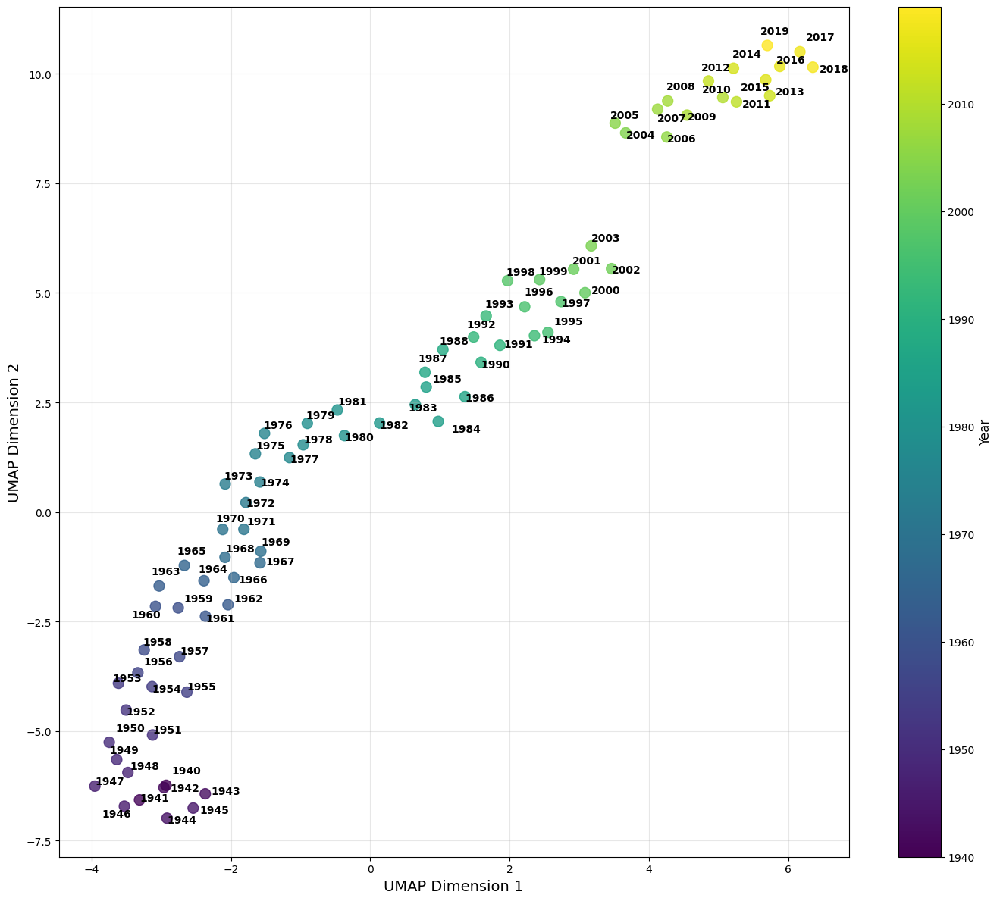

In [33]:
fix, ax = visualize_year_embeddings(asr_year_emb_ave)
plt.show()

<ipython-input-32-d8dbbcb825dc>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(colormap)


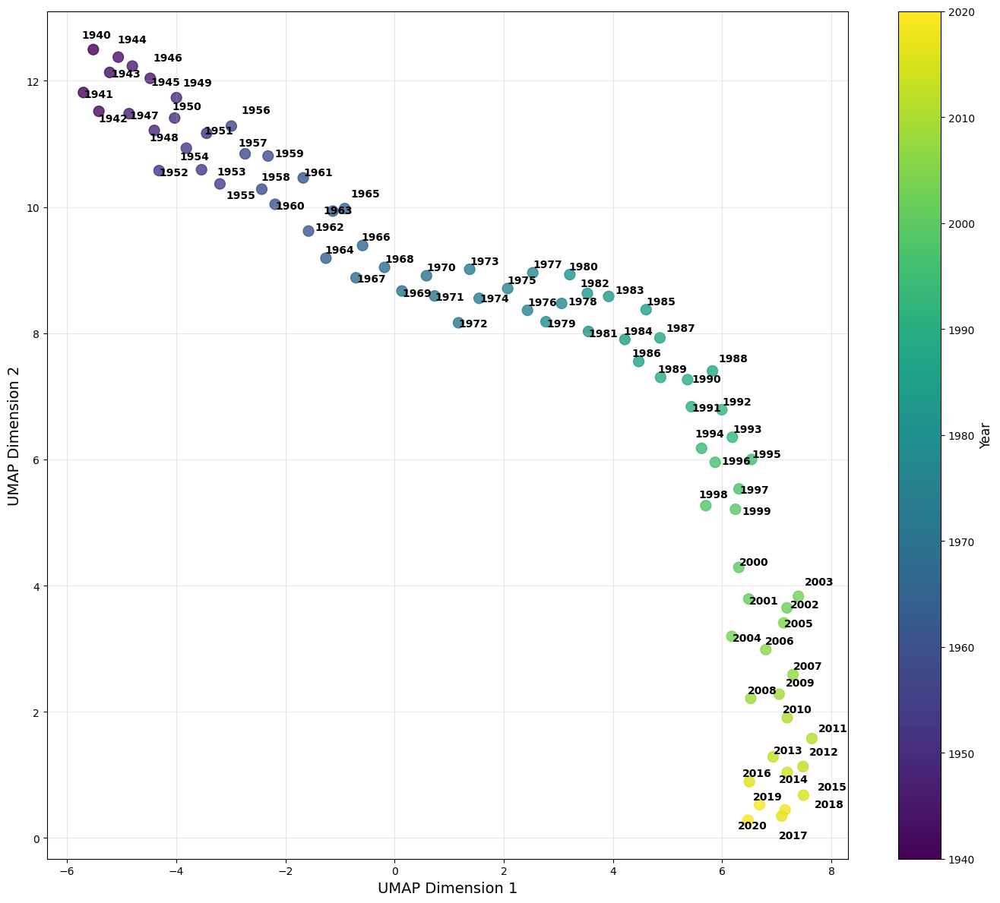

In [34]:
fix, ax = visualize_year_embeddings(ajs_year_emb_ave)
plt.show()

**MDS**

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances

def visualize_year_embeddings_mvu(year_to_embeddings,
                               k=10, figsize=(14, 12), point_size=100,
                               colormap='viridis', show_labels=True,
                               force_text_adjust=0.5):
    years = []
    embeddings = []

    for year, embedding in year_to_embeddings.items():
        years.append(year)
        embeddings.append(embedding)

    years = np.array(years)
    embeddings = np.array(embeddings)

    distances = pairwise_distances(embeddings)

    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
    embedding_2d = mds.fit_transform(distances)

    df = pd.DataFrame({
        'x': embedding_2d[:, 0],
        'y': embedding_2d[:, 1],
        'year': years
    })

    min_year = min(years)
    max_year = max(years)
    norm = mcolors.Normalize(vmin=min_year, vmax=max_year)
    cmap = plt.cm.get_cmap(colormap)
    fig, ax = plt.subplots(figsize=figsize)

    scatter = ax.scatter(df['x'], df['y'],
                        c=df['year'],
                        cmap=cmap,
                        norm=norm,
                        s=point_size,
                        alpha=0.8)

    texts = []
    if show_labels:
        for i, row in df.iterrows():
            texts.append(ax.text(row['x'], row['y'], str(int(row['year'])),
                      fontsize=10, fontweight='bold'))

        try:
            from adjustText import adjust_text
            adjust_text(texts,
                      force_text=force_text_adjust,
                      force_points=0.2,
                      expand_text=(1.2, 1.2),
                      expand_points=(1.2, 1.2))
        except ImportError:
            print("Install 'adjustText' package for better label positioning")

    cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label('Year', fontsize=12)

    plt.xlabel('MVU Dimension 1', fontsize=14)
    plt.ylabel('MVU Dimension 2', fontsize=14)
    plt.grid(alpha=0.3)
    plt.tight_layout()

    return fig, ax

<ipython-input-36-a1d868ec60a3>:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(colormap)


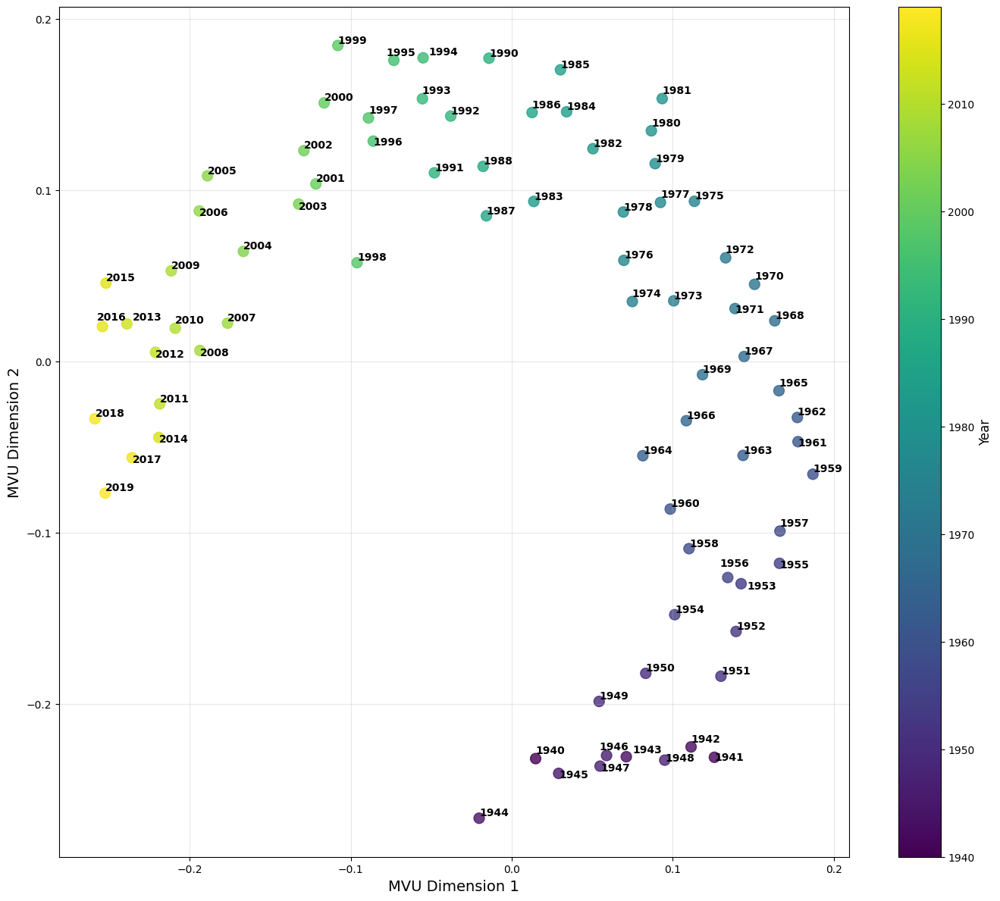

In [37]:
fix, ax = visualize_year_embeddings_mvu(asr_year_emb_ave)
plt.show()

<ipython-input-36-a1d868ec60a3>:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(colormap)


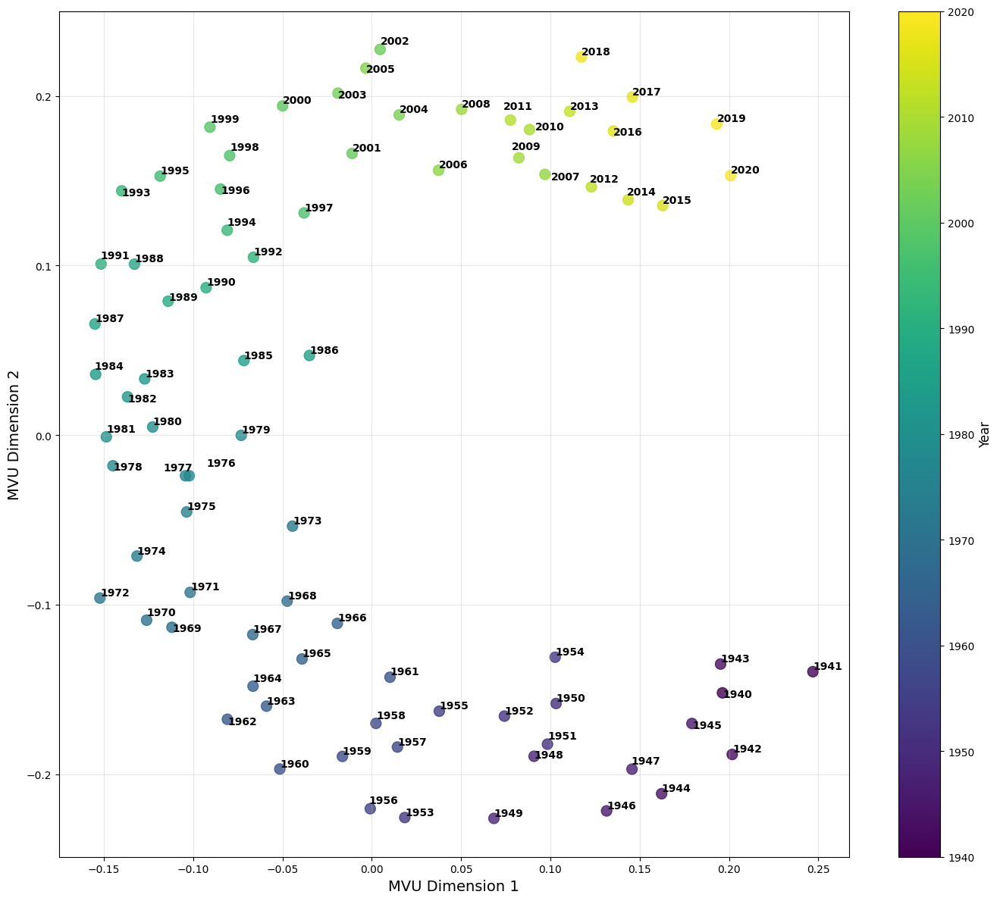

In [38]:
fix, ax = visualize_year_embeddings_mvu(ajs_year_emb_ave)
plt.show()

**Hierarchical clustering**

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

def hierarchical_cluster_years(year_embeddings):

    years = list(year_embeddings.keys())
    embeddings = np.array([year_embeddings[year] for year in years])

    Z = linkage(embeddings, method='ward')

    min_year = min(years)
    max_year = max(years)
    normalized_years = [(y - min_year) / (max_year - min_year) for y in years]
    colors = cm.viridis(normalized_years)
    year_colors = {year: color for year, color in zip(years, colors)}
    plt.figure(figsize=(12, 14))

    dendrogram(
        Z,
        labels=years,
        orientation='right',
        leaf_font_size=10,
        leaf_rotation=0,
    )

    ax = plt.gca()
    for label in ax.get_ymajorticklabels():
        year = int(label.get_text())
        label.set_color(year_colors[year])

    plt.grid(False)
    plt.box(False)
    plt.yticks(fontsize=12)
    plt.xlabel('Distance', fontsize=12)
    plt.tight_layout()
    plt.show()

    return Z

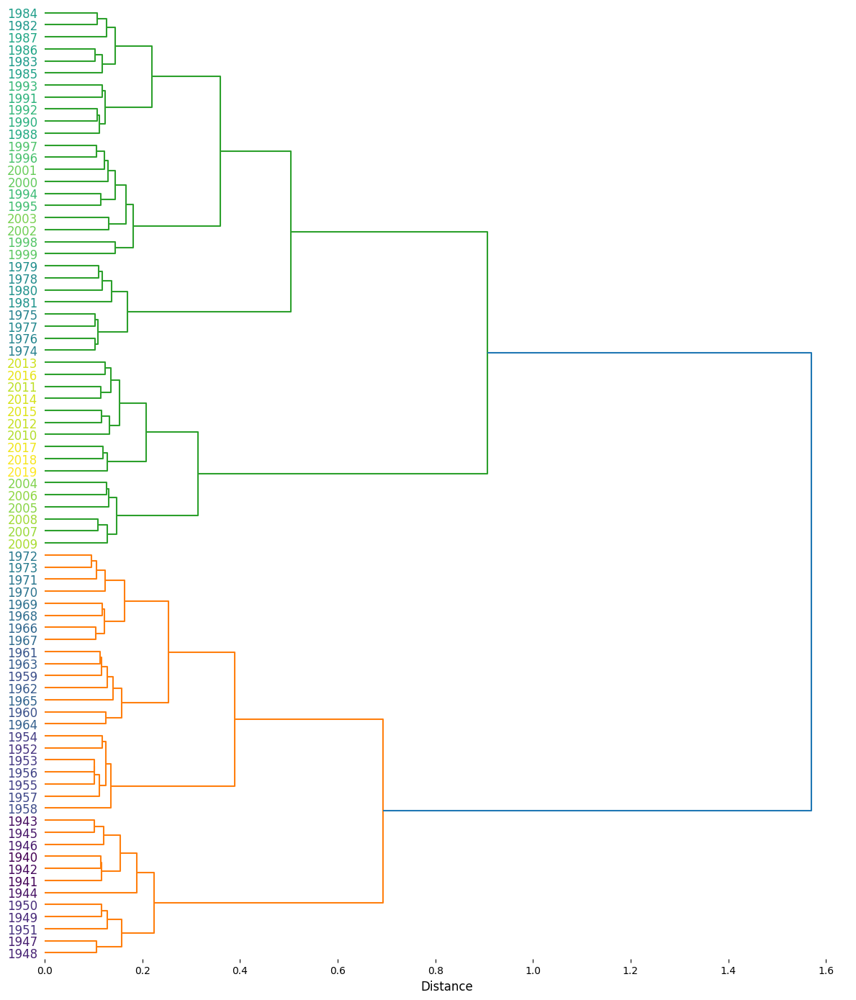

In [42]:
Z = hierarchical_cluster_years(asr_year_emb_ave)

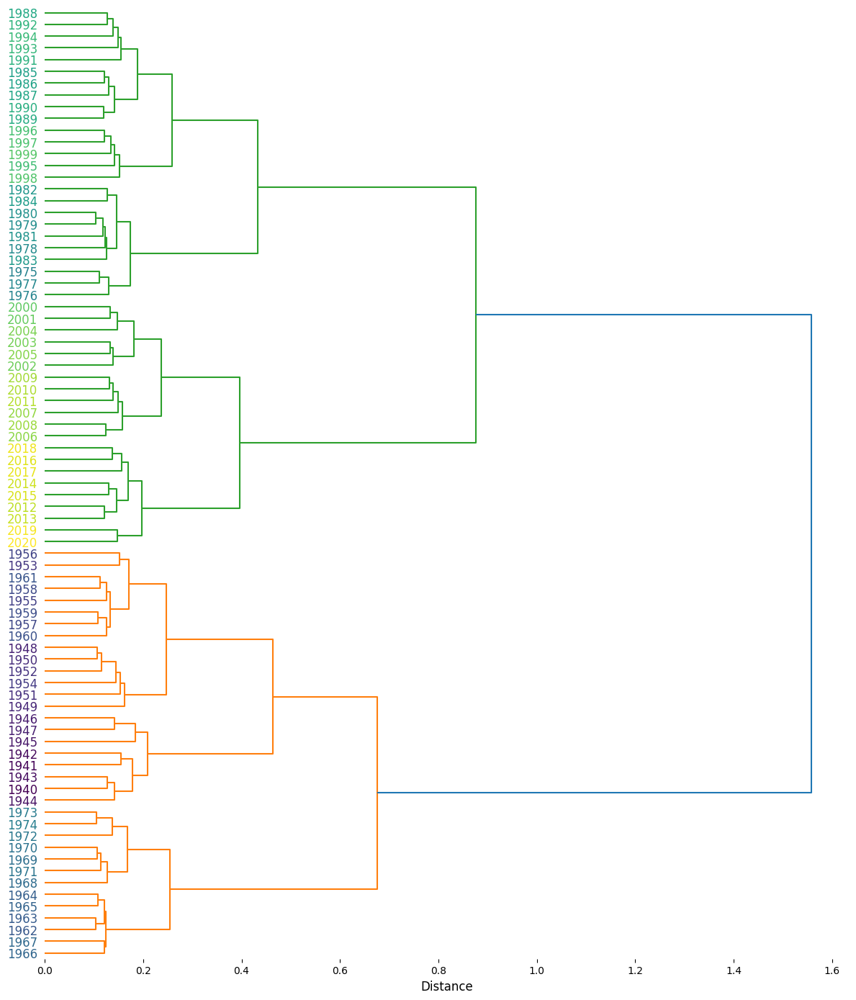

In [43]:
Z = hierarchical_cluster_years(ajs_year_emb_ave)

**heatmap cos similarity**

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import cosine
import pandas as pd

def create_year_similarity_heatmap(year_embeddings):

    sorted_years = sorted(year_embeddings.keys())
    n_years = len(sorted_years)

    similarity_matrix = np.zeros((n_years, n_years))

    for i, year1 in enumerate(sorted_years):
        for j, year2 in enumerate(sorted_years):
            embed1 = year_embeddings[year1]
            embed2 = year_embeddings[year2]
            similarity_matrix[i, j] = 1 - cosine(embed1, embed2)

    similarity_df = pd.DataFrame(
        similarity_matrix,
        index=sorted_years,
        columns=sorted_years
    )

    plt.figure(figsize=(14, 12))

    vmin = similarity_matrix.min()
    vmax = similarity_matrix.max()

    ax = sns.heatmap(
        similarity_df,
        annot=False,
        cmap='coolwarm',
        vmin=vmin,
        vmax=vmax,
        square=True,
        linewidths=0.5,
        cbar_kws={'label': 'Cosine Similarity'}
    )

    if len(sorted_years) > 20:
        tick_indices = np.linspace(0, len(sorted_years) - 1, min(20, len(sorted_years))).astype(int)
        plt.xticks(tick_indices + 0.5, [sorted_years[i] for i in tick_indices], rotation=45, ha='right')
        plt.yticks(tick_indices + 0.5, [sorted_years[i] for i in tick_indices], rotation=0)
    else:
        plt.xticks(np.arange(len(sorted_years)) + 0.5, sorted_years, rotation=45, ha='right')
        plt.yticks(np.arange(len(sorted_years)) + 0.5, sorted_years, rotation=0)

    ax.set_xlabel('Year', fontsize=14, labelpad=10)
    ax.set_ylabel('Year', fontsize=14, labelpad=10)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    return similarity_df, plt.gcf()

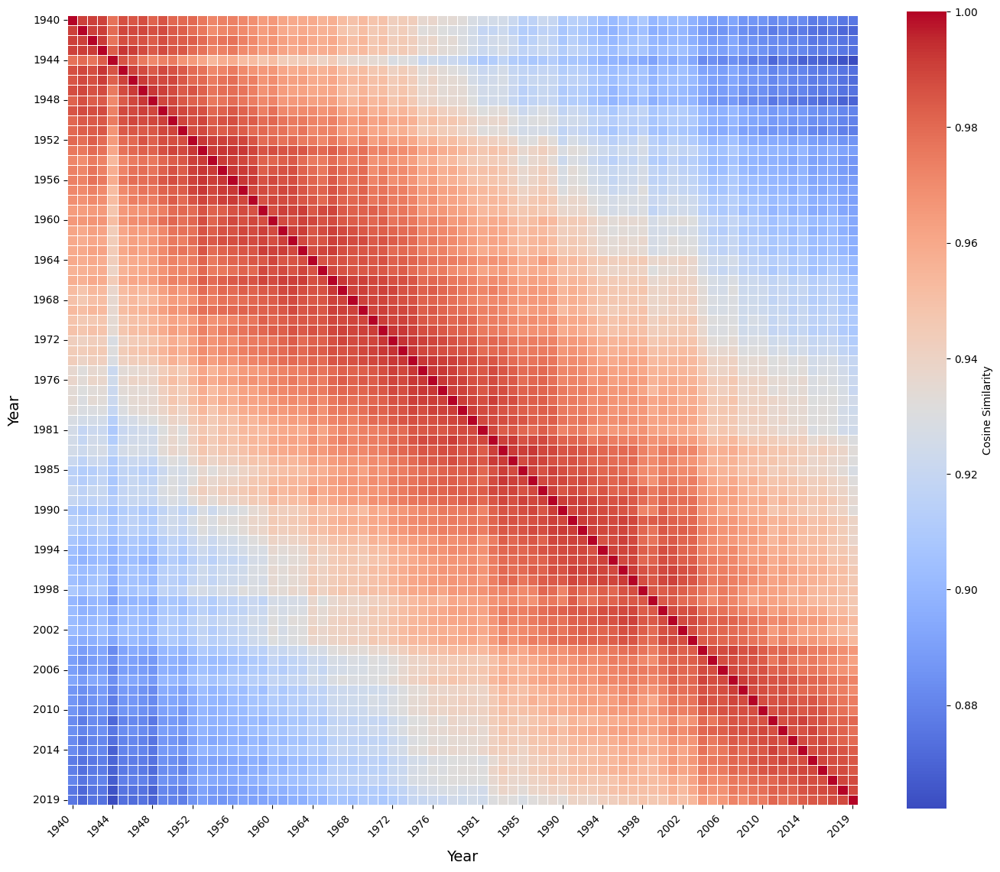

In [47]:
similarity_df, fig = create_year_similarity_heatmap(asr_year_emb_ave)
plt.show()

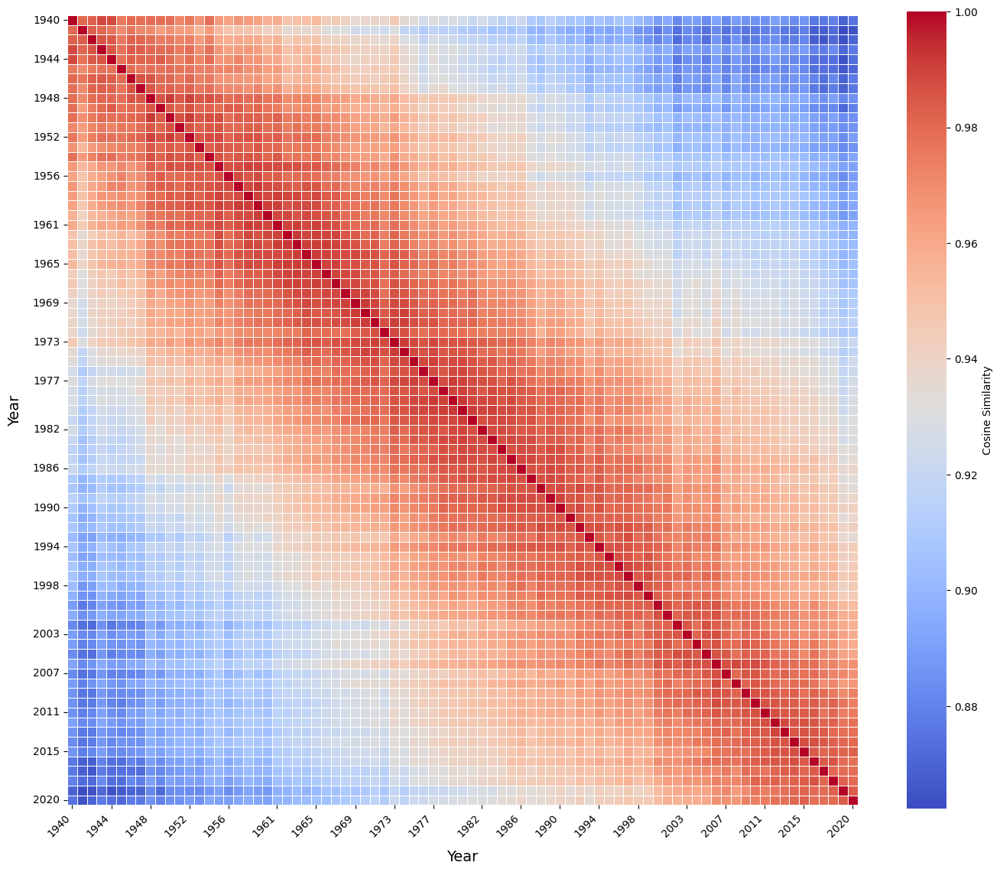

In [48]:
similarity_df, fig = create_year_similarity_heatmap(ajs_year_emb_ave)
plt.show()

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_distances

def distance_from_origin(year_embeddings):

    years = sorted(year_embeddings.keys())
    baseline = year_embeddings[1940]

    dist_euc = [
        np.linalg.norm(year_embeddings[y] - baseline)
        for y in years
    ]

    dist_cos = [
        cosine_distances(
          year_embeddings[y].reshape(1, -1),
          baseline.reshape(1, -1)
        )[0,0]
        for y in years
    ]

    plt.figure(figsize=(10, 4))
    plt.plot(years, dist_euc, marker='o', label='Euclidean distance')
    plt.plot(years, dist_cos, marker='s', linestyle='--', label='Cosine distance')

    selected_years = [y for y in years if y % 5 == 0]
    plt.xticks(selected_years, rotation=45)
    plt.xlabel('Year')
    plt.ylabel('Distance from 1940')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

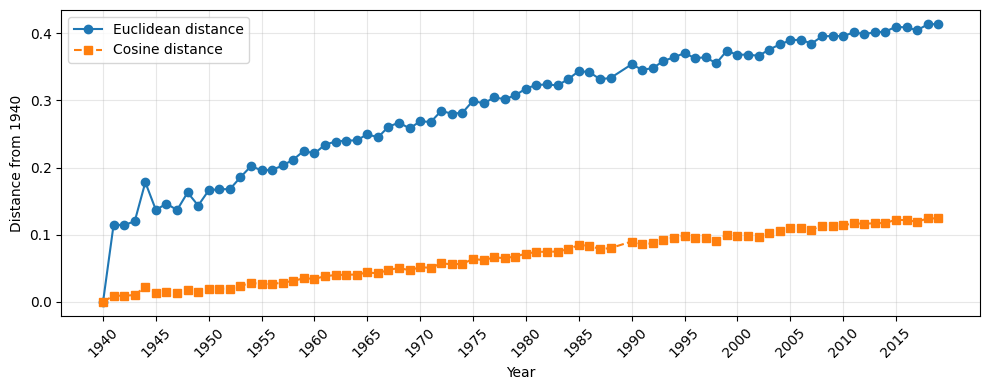

In [32]:
distance_from_origin(asr_year_emb_ave)

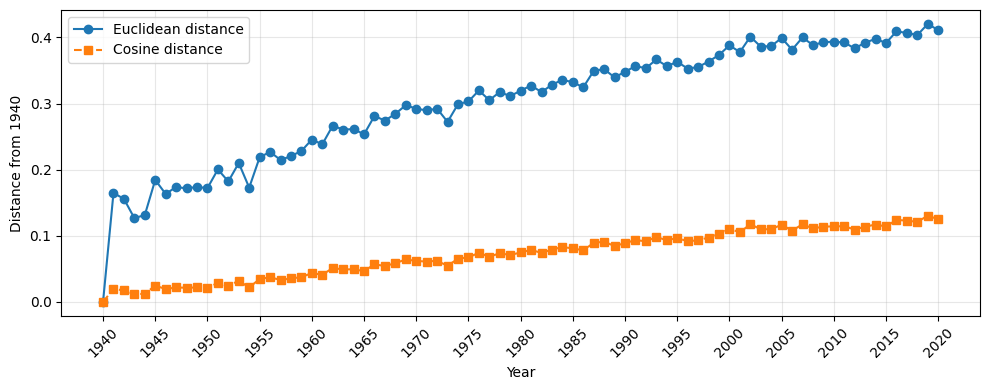

In [34]:
distance_from_origin(ajs_year_emb_ave)

**euc dif vs cos dif**

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean, cosine
import pandas as pd
from adjustText import adjust_text

def analyze_embedding_differences(year_embeddings):

    sorted_years = sorted(year_embeddings.keys())

    differences = []
    for i in range(len(sorted_years) - 1):
        year1 = sorted_years[i]
        year2 = sorted_years[i + 1]

        embedding1 = year_embeddings[year1]
        embedding2 = year_embeddings[year2]

        euclidean_diff = euclidean(embedding1, embedding2)
        cosine_diff = cosine(embedding1, embedding2)

        differences.append({
            'year_pair': f"{year1}-{year2}",
            'later_year': year2,
            'euclidean': euclidean_diff,
            'cosine': cosine_diff
        })

    df = pd.DataFrame(differences)
    print("Calculated embedding differences between successive years:")
    print(df)

    fig = plt.figure(figsize=(10, 8))
    plt.scatter(df['euclidean'], df['cosine'], s=100)

    texts = []
    for i, row in df.iterrows():
        text = plt.annotate(
            str(row['later_year']),
            (row['euclidean'], row['cosine']),
            fontsize=10,
            alpha=0.8
        )
        texts.append(text)

    adjust_text(
        texts,
        arrowprops=dict(arrowstyle='-', color='gray', alpha=0.6),
        expand_points=(1.5, 1.5),
        force_points=(0.5, 0.5)
    )

    plt.xlabel('Euclidean Distance', fontsize=12)
    plt.ylabel('Cosine Distance', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xlim(min(df['euclidean']) * 0.85, max(df['euclidean']) * 1.15)
    plt.ylim(min(df['cosine']) * 0.85, max(df['cosine']) * 1.15)
    fig.set_size_inches(14, 10)
    plt.tight_layout()

    return df, fig

Calculated embedding differences between successive years:
    year_pair  later_year  euclidean    cosine
0   1940-1941        1941   0.114966  0.009347
1   1941-1942        1942   0.116808  0.009623
2   1942-1943        1943   0.108670  0.008340
3   1943-1944        1944   0.152172  0.016548
4   1944-1945        1945   0.144266  0.014528
..        ...         ...        ...       ...
73  2014-2015        2015   0.129092  0.012539
74  2015-2016        2016   0.121462  0.011197
75  2016-2017        2017   0.129192  0.012667
76  2017-2018        2018   0.119197  0.010772
77  2018-2019        2019   0.123517  0.011502

[78 rows x 4 columns]


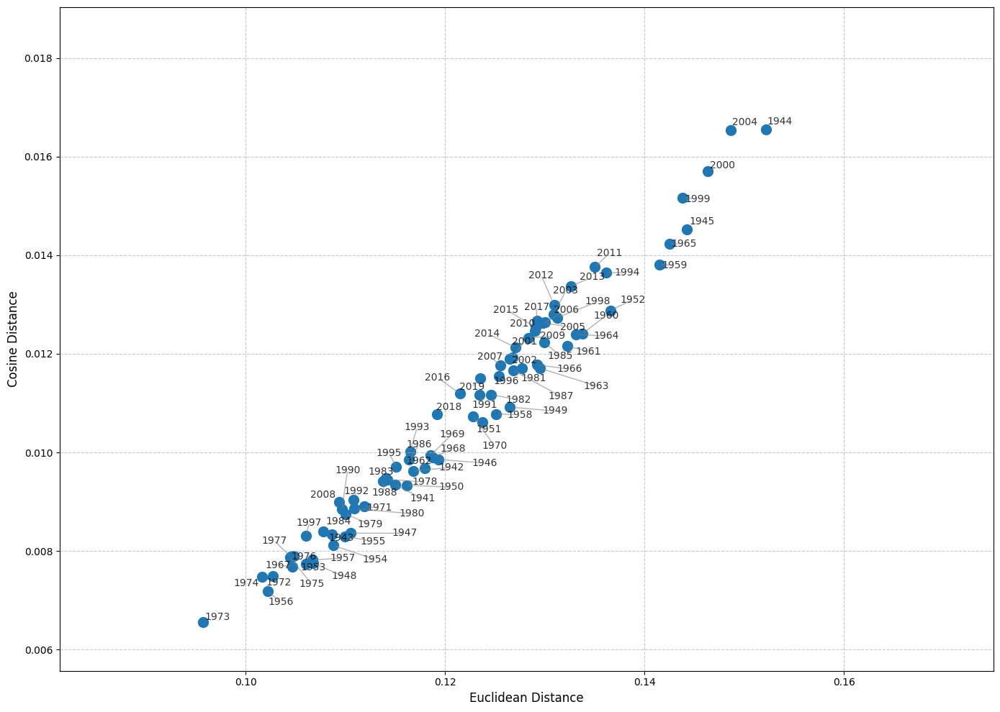

In [62]:
df, fig = analyze_embedding_differences(asr_year_emb_ave)
plt.show()

Calculated embedding differences between successive years:
    year_pair  later_year  euclidean    cosine
0   1940-1941        1941   0.164770  0.019579
1   1941-1942        1942   0.154511  0.017012
2   1942-1943        1943   0.140175  0.014041
3   1943-1944        1944   0.144603  0.014899
4   1944-1945        1945   0.178029  0.022574
..        ...         ...        ...       ...
75  2015-2016        2016   0.145097  0.015990
76  2016-2017        2017   0.145502  0.016061
77  2017-2018        2018   0.158608  0.019160
78  2018-2019        2019   0.152825  0.017612
79  2019-2020        2020   0.147534  0.016358

[80 rows x 4 columns]


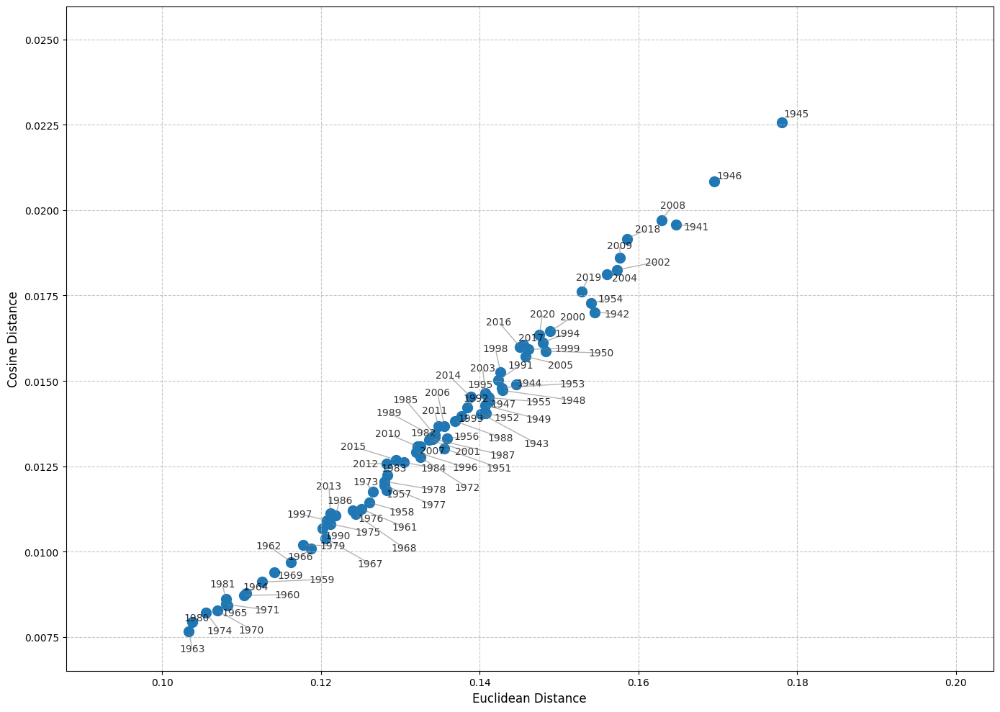

In [63]:
df, fig = analyze_embedding_differences(ajs_year_emb_ave)
plt.show()

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine
import pandas as pd
from adjustText import adjust_text

def analyze_paper_year_similarities(year_embeddings, paper_embedding):

    paper_embedding = np.array(paper_embedding)
    sorted_years = sorted(year_embeddings.keys())
    similarities = []

    for year in sorted_years:
        year_embedding = year_embeddings[year]
        cosine_similarity = 1 - cosine(paper_embedding, year_embedding)
        similarities.append({
            'year': year,
            'cosine_similarity': cosine_similarity
        })

    df = pd.DataFrame(similarities)
    print("Calculated cosine similarities between paper and each year:")
    print(df)

    fig = plt.figure(figsize=(14, 8))

    plt.plot(df['year'], df['cosine_similarity'], marker='o', linestyle='-', linewidth=2, markersize=8)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Cosine Similarity', fontsize=12)
    selected_years = [y for y in sorted_years if y % 5 == 0]
    plt.xticks(selected_years, rotation=45)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    max_similarity_row = df.loc[df['cosine_similarity'].idxmax()]
    max_year = max_similarity_row['year']
    max_similarity = max_similarity_row['cosine_similarity']

    plt.axvline(x=max_year, color='r', linestyle='--', alpha=0.5)
    plt.scatter([max_year], [max_similarity], s=100, color='red', zorder=5)
    plt.annotate(f"Most similar: {max_year:.0f} ({max_similarity:.4f})",
                xy=(max_year, max_similarity),
                xytext=(max_year+0.5, max_similarity),
                fontsize=12,
                color='red',
                fontweight='bold',
                arrowprops=dict(arrowstyle='->', color='red'))

    return df, fig

In [38]:
granovetter = ajs_paper_gemini_embeddings_ave["10.1086/225469"]

In [39]:
coleman = ajs_paper_gemini_embeddings_ave["10.1086/228943"]

In [40]:
dimaggio_powell = asr_paper_gemini_embeddings_ave["10.2307/2095101"]

In [41]:
gouldner = asr_paper_gemini_embeddings_ave["10.2307/2092623"]

Calculated cosine similarities between paper and each year:
    year  cosine_similarity
0   1940           0.781514
1   1941           0.783983
2   1942           0.771820
3   1943           0.782580
4   1944           0.770620
..   ...                ...
74  2015           0.798064
75  2016           0.797777
76  2017           0.807460
77  2018           0.793262
78  2019           0.786366

[79 rows x 2 columns]


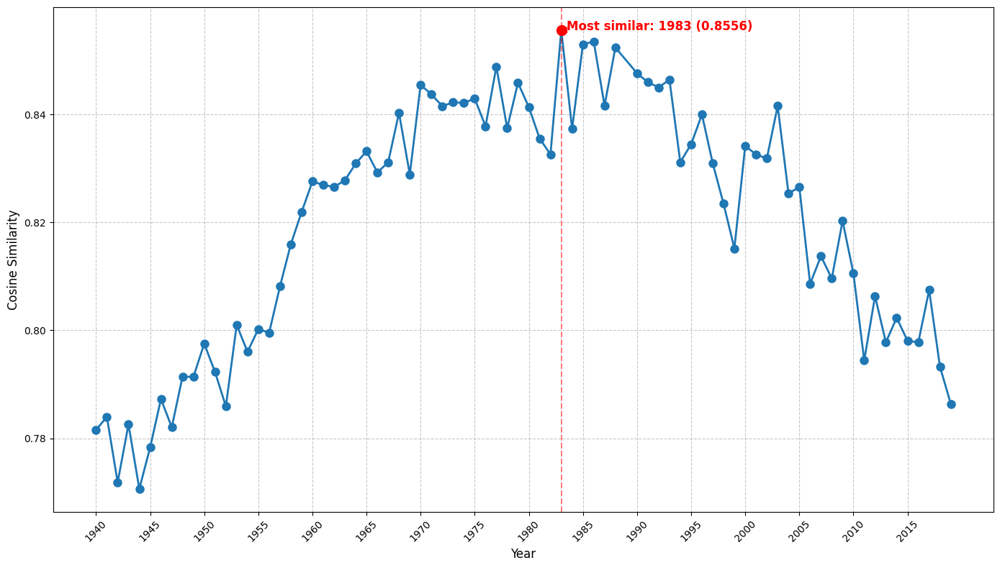

In [45]:
df, fig = analyze_paper_year_similarities(asr_year_emb_ave, dimaggio_powell)
plt.show()

Calculated cosine similarities between paper and each year:
    year  cosine_similarity
0   1940           0.814997
1   1941           0.826955
2   1942           0.819011
3   1943           0.821081
4   1944           0.804142
..   ...                ...
74  2015           0.773259
75  2016           0.766612
76  2017           0.772860
77  2018           0.775845
78  2019           0.761274

[79 rows x 2 columns]


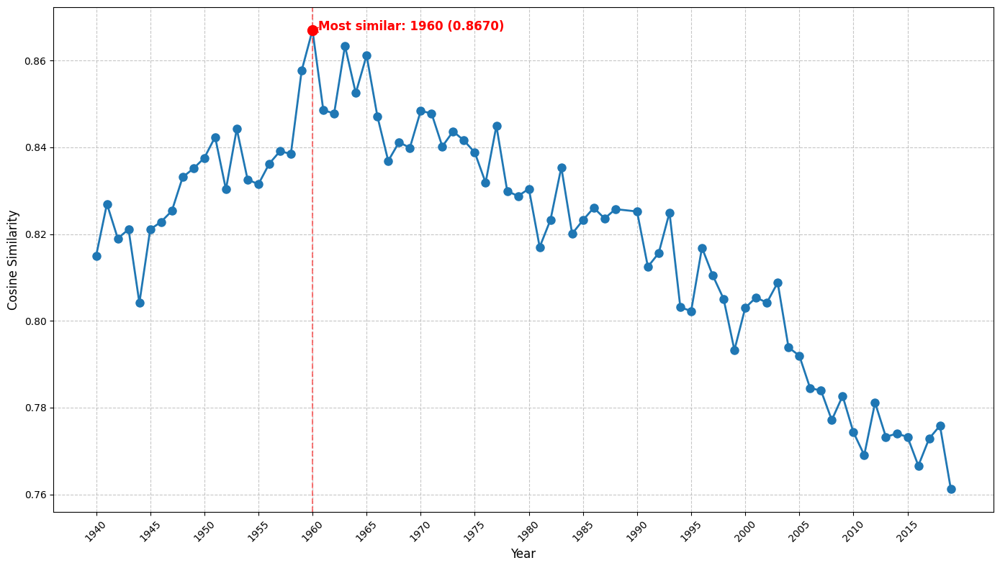

In [46]:
df, fig = analyze_paper_year_similarities(asr_year_emb_ave, gouldner)
plt.show()

Calculated cosine similarities between paper and each year:
    year  cosine_similarity
0   1940           0.788814
1   1941           0.766861
2   1942           0.778504
3   1943           0.784168
4   1944           0.788027
..   ...                ...
76  2016           0.809314
77  2017           0.804800
78  2018           0.797993
79  2019           0.796997
80  2020           0.796065

[81 rows x 2 columns]


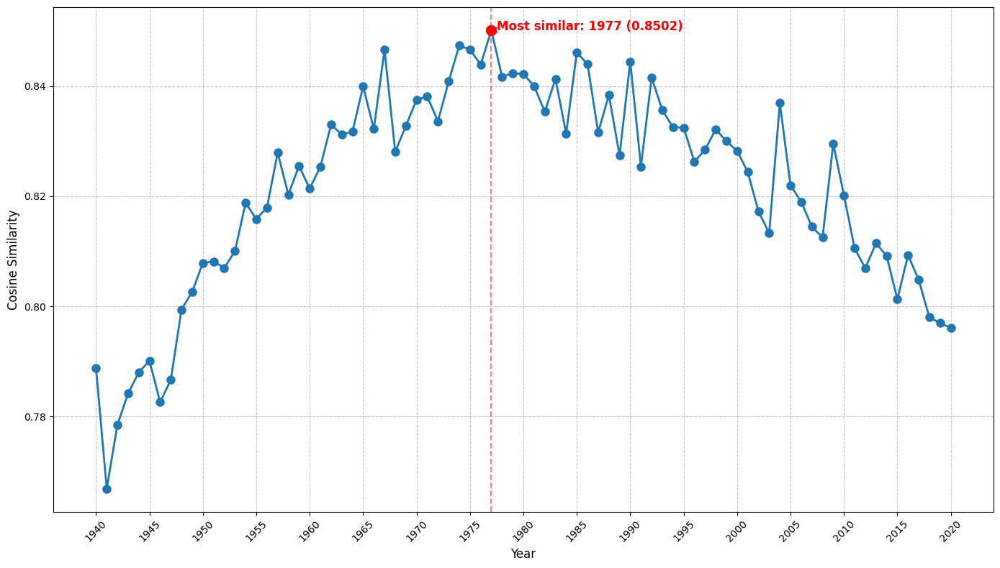

In [47]:
df, fig = analyze_paper_year_similarities(ajs_year_emb_ave, granovetter)
plt.show()

Calculated cosine similarities between paper and each year:
    year  cosine_similarity
0   1940           0.773981
1   1941           0.761382
2   1942           0.777526
3   1943           0.773408
4   1944           0.769924
..   ...                ...
76  2016           0.794026
77  2017           0.801561
78  2018           0.792263
79  2019           0.788195
80  2020           0.787890

[81 rows x 2 columns]


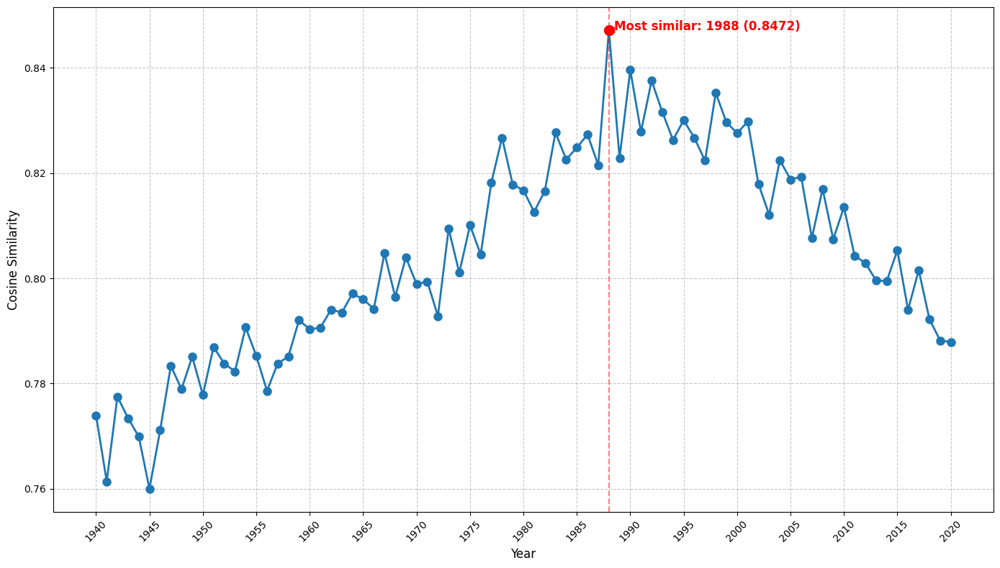

In [48]:
df, fig = analyze_paper_year_similarities(ajs_year_emb_ave, coleman)
plt.show()

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import umap

def visualize_embeddings_umap(year_embeddings, chosen_paper_embedding, chosen_paper_name="Chosen Paper"):
    years = list(year_embeddings.keys())
    embeddings = list(year_embeddings.values())
    all_embeddings = embeddings + [chosen_paper_embedding]
    all_embeddings_array = np.array(all_embeddings)

    reducer = umap.UMAP(n_neighbors=15, min_dist=0.7, n_components=2, random_state=42)
    embedding_2d = reducer.fit_transform(all_embeddings_array)

    plt.style.use('default')
    plt.figure(figsize=(12, 9))

    min_year = min(years)
    max_year = max(years)
    norm = plt.Normalize(min_year, max_year)

    cmap = plt.cm.viridis
    sc = plt.scatter(
        embedding_2d[:-1, 0],
        embedding_2d[:-1, 1],
        c=years,
        cmap=cmap,
        norm=norm,
        s=100,
        alpha=0.8
    )

    cbar = plt.colorbar(sc)
    cbar.set_label('Year', fontsize=12)

    plt.scatter(
        embedding_2d[-1, 0],
        embedding_2d[-1, 1],
        color='red',
        marker='*',
        s=300,
        label=chosen_paper_name,
        edgecolors='black',
        linewidth=1.5,
        zorder=5
    )

    # Improved label placement to avoid overlaps
    from adjustText import adjust_text

    texts = []
    for i, year in enumerate(years):
        # Create text annotations but don't place them yet
        text = plt.text(
            embedding_2d[i, 0],
            embedding_2d[i, 1],
            str(year),
            fontsize=10,
            ha='center',
            va='center',
            bbox=dict(boxstyle="round,pad=0.1", fc="white", ec="none", alpha=0.7)
        )
        texts.append(text)

    # Adjust text positions to avoid overlaps
    adjust_text(
        texts,
        x=embedding_2d[:-1, 0],
        y=embedding_2d[:-1, 1],
        arrowprops=dict(arrowstyle='-', color='gray', lw=0.5),
        expand_points=(1.5, 1.5)
    )

    # Add the chosen paper annotation
    plt.annotate(
        chosen_paper_name,
        (embedding_2d[-1, 0], embedding_2d[-1, 1]),
        fontsize=12,
        weight='bold',
        xytext=(10, 10),
        textcoords='offset points',
        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8)
    )

    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()

    return plt

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


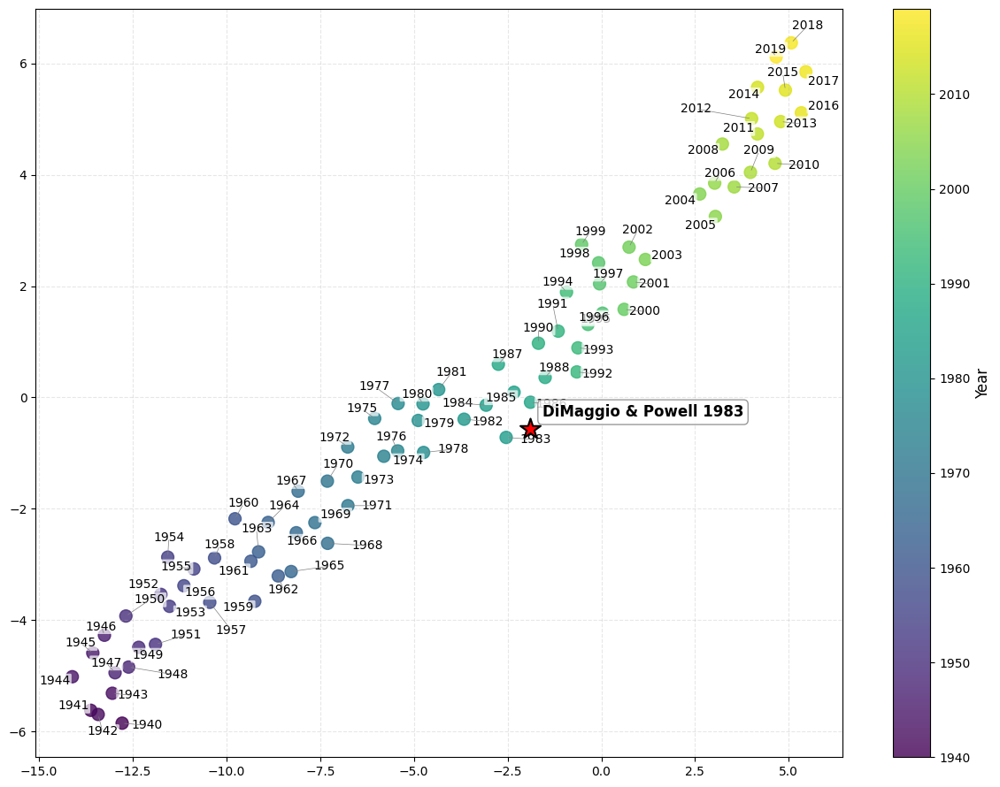

In [83]:
plt = visualize_embeddings_umap(asr_year_emb_ave, dimaggio_powell, "DiMaggio & Powell 1983")
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


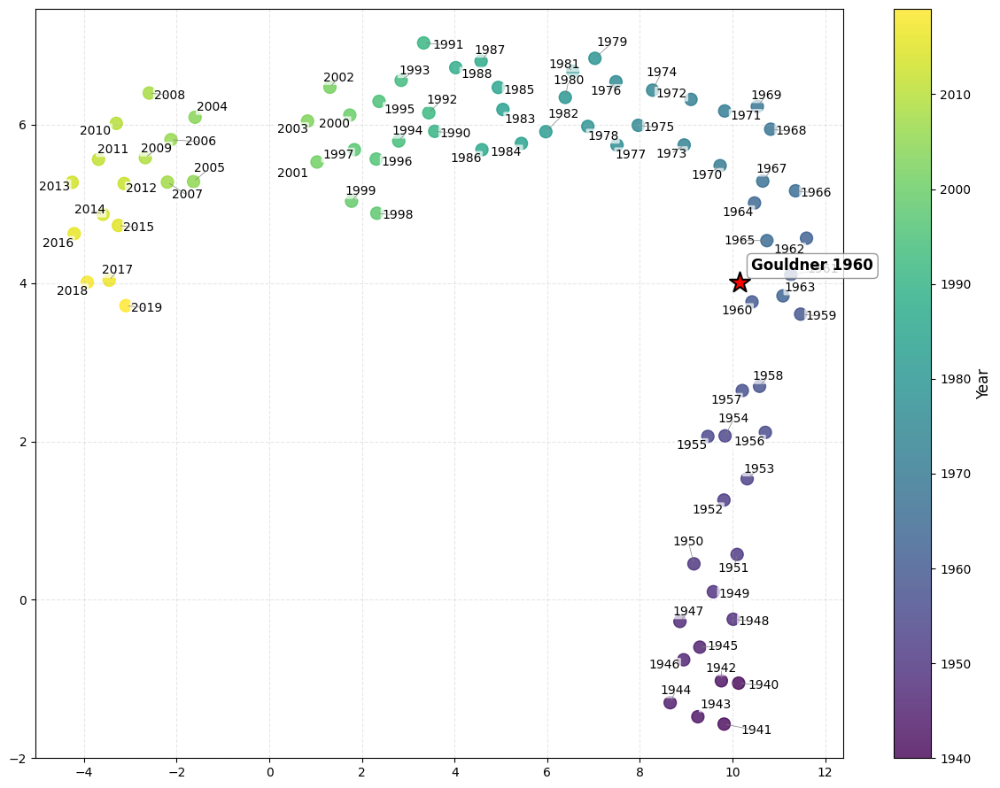

In [84]:
plt = visualize_embeddings_umap(asr_year_emb_ave, gouldner, "Gouldner 1960")
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


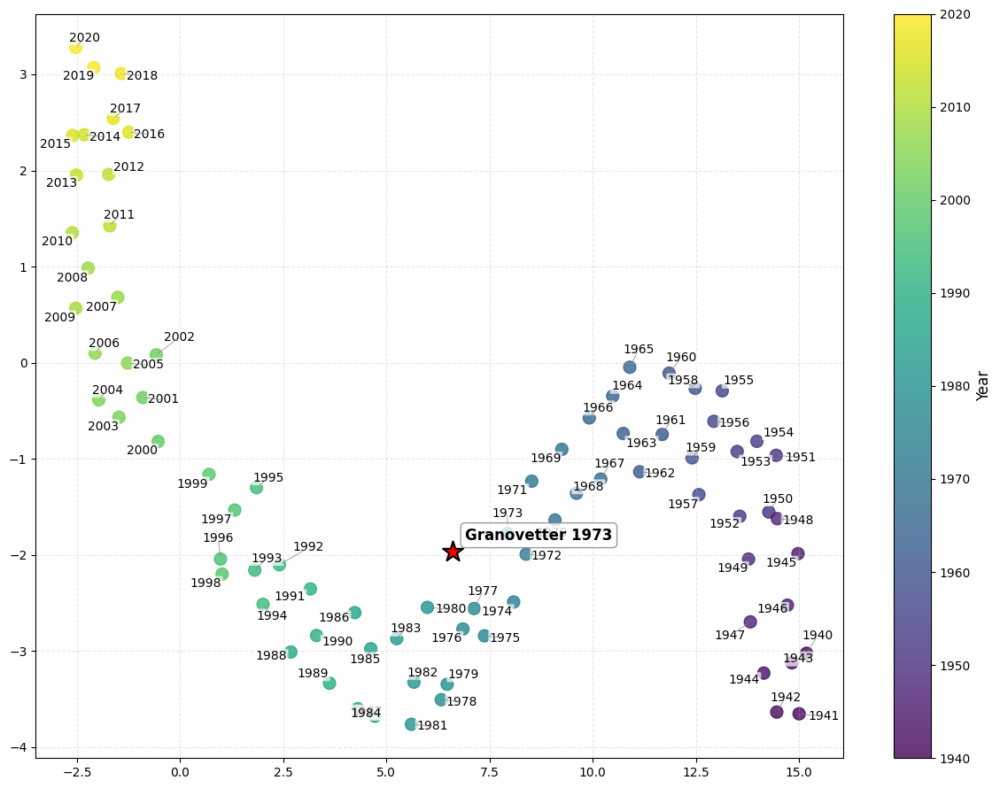

In [85]:
plt = visualize_embeddings_umap(ajs_year_emb_ave, granovetter, "Granovetter 1973")
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


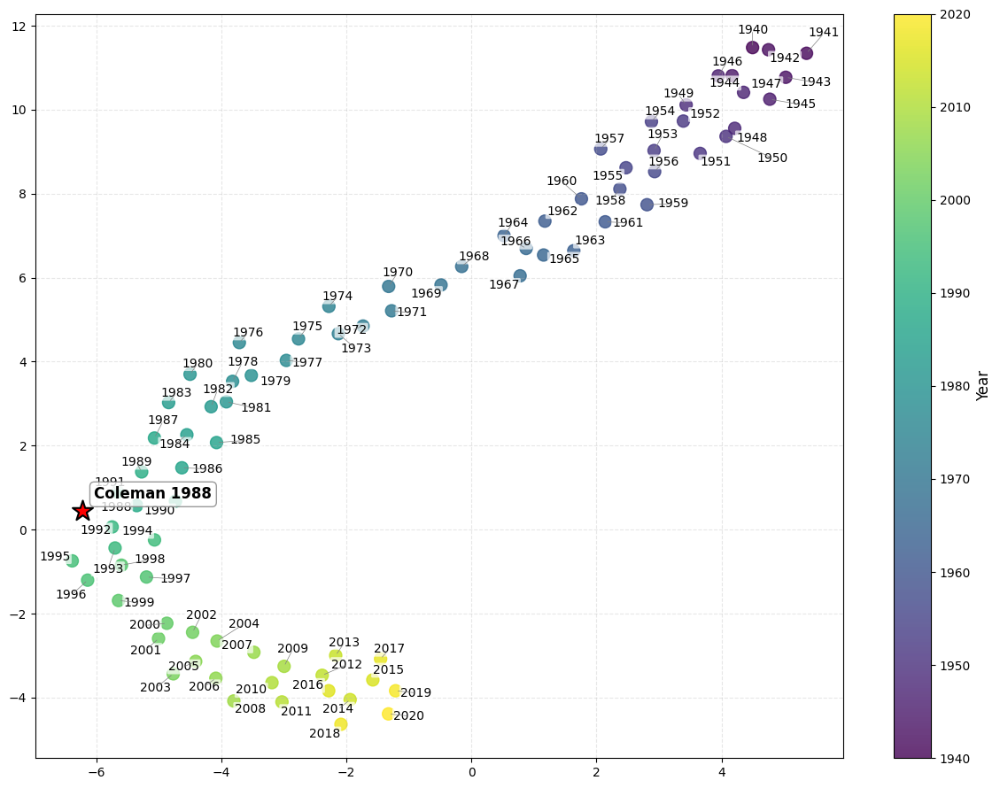

In [86]:
plt = visualize_embeddings_umap(ajs_year_emb_ave, coleman, "Coleman 1988")
plt.show()

### (cluster membership)

In [148]:
asr_embedding_list = []
for value in asr_year_embeddings.values():
    asr_embedding_list.extend(value)
asr_embedding_array = np.array(asr_embedding_list)

**Kmeans**

In [160]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
from sklearn.decomposition import PCA
import tqdm.notebook as tqdm

def find_optimal_clusters_accelerated(embeddings, max_k=50, n_jobs=-1, use_pca=True, pca_dim=100):

    if use_pca:
        pca = PCA(n_components=pca_dim, random_state=42)
        embeddings = pca.fit_transform(embeddings)
        print(f"Variance explained: {np.sum(pca.explained_variance_ratio_):.4f}")

    max_k = min(max_k, len(embeddings) - 1)

    def evaluate_kmeans(k):
        kmeans = KMeans(
            n_clusters=k,
            random_state=42,
            n_init=10,
            algorithm='elkan',
            tol=1e-4
        )

        cluster_labels = kmeans.fit_predict(embeddings)
        score = silhouette_score(embeddings, cluster_labels)
        return k, score

    k_values = range(2, max_k + 1)
    print(f"Testing k values from 2 to {max_k} in parallel...")

    results = Parallel(n_jobs=n_jobs)(
        delayed(evaluate_kmeans)(k) for k in tqdm.tqdm(k_values)
    )

    k_values = [r[0] for r in results]
    scores = [r[1] for r in results]

    optimal_k = k_values[np.argmax(scores)]

    plt.figure(figsize=(10, 6))
    plt.plot(k_values, scores, 'o-')
    plt.axvline(x=optimal_k, color='r', linestyle='--')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score Method for Optimal k')
    plt.grid(True)
    plt.show()

    print(f"Optimal number of clusters: {optimal_k}")
    return optimal_k, scores

def apply_kmeans_clustering_accelerated(embeddings, k=None, use_pca=True, pca_dim=50):
    pca = None
    if use_pca and embeddings.shape[1] > pca_dim:
        print(f"Applying PCA reduction from {embeddings.shape[1]} to {pca_dim} dimensions...")
        pca = PCA(n_components=pca_dim, random_state=42)
        embeddings_reduced = pca.fit_transform(embeddings)
        print(f"Variance explained: {np.sum(pca.explained_variance_ratio_):.4f}")
    else:
        embeddings_reduced = embeddings

    if k is None:
        k, _ = find_optimal_clusters_accelerated(
            embeddings_reduced,
            use_pca=False
        )

    print(f"Applying K-means with k={k}...")
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10,
        algorithm='elkan',
        tol=1e-4
    )
    labels = kmeans.fit_predict(embeddings_reduced)

    return kmeans, labels, pca

Variance explained: 0.6203
Testing k values from 2 to 200 in parallel...


  0%|          | 0/199 [00:00<?, ?it/s]

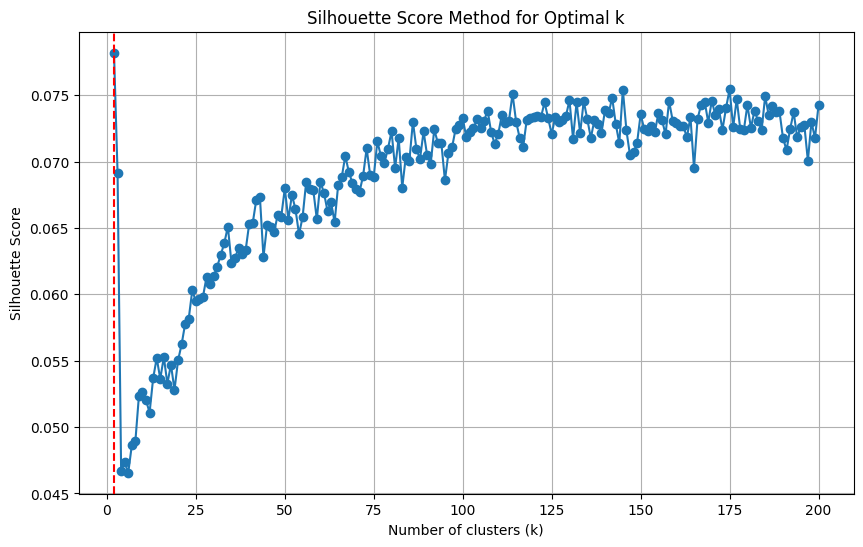

Optimal number of clusters: 2


(2,
 [np.float64(0.07820997907493983),
  np.float64(0.06913370015432867),
  np.float64(0.04672152821995569),
  np.float64(0.047332217390081185),
  np.float64(0.04655751499913512),
  np.float64(0.048616064754378054),
  np.float64(0.048915629424376376),
  np.float64(0.052349318184616536),
  np.float64(0.05265098179345024),
  np.float64(0.05200354423078821),
  np.float64(0.0510903324651644),
  np.float64(0.0536756439936026),
  np.float64(0.05519972130618322),
  np.float64(0.0536327336758227),
  np.float64(0.05527394825464532),
  np.float64(0.053272773635412836),
  np.float64(0.05470037527646747),
  np.float64(0.05280040131431768),
  np.float64(0.055024066653994654),
  np.float64(0.056230766180700324),
  np.float64(0.057792445834733454),
  np.float64(0.05817494396129504),
  np.float64(0.060306029103913535),
  np.float64(0.059464244195998994),
  np.float64(0.059672757408148244),
  np.float64(0.0598153342154695),
  np.float64(0.061302516484532485),
  np.float64(0.06076137279041859),
  np.flo

In [163]:
asr_embedding_list = []
for value in asr_year_embeddings.values():
    asr_embedding_list.extend(value)
asr_embedding_array = np.array(asr_embedding_list)
find_optimal_clusters_accelerated(asr_embedding_list, max_k=200, use_pca=True)

## Decade trend


### Cluster by decades

Cluster each decade's papers

In [88]:
def get_decade_paper_dois(doi_issue_dict, decade, length, start_year):
    decade_dois = []
    for doi, issue in doi_issue_dict.items():
        try:
            year_str = issue.split('(')[0].strip()
            if year_str == 'N/A':
                continue
            year = int(year_str) + start_year
            if year >= decade and year < decade + length:
                decade_dois.append(doi)
        except KeyError:
            print(f"KeyError: {doi}")
    return decade_dois

In [89]:
def get_decade_stuff(stuff, decade_dois):
    decade_embeddings = {}
    for doi in decade_dois:
        for key, value in stuff.items():
            if doi == key:
              decade_embeddings[doi] = stuff[doi]
    return decade_embeddings

In [90]:
def stuff_clustering(paper_embeddings, doi_issue_dict, start_year, length=10):
    decades = [1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010]
    decades_embeddings = {}
    for decade in decades:
        decade_paper_dois = get_decade_paper_dois(doi_issue_dict, decade, length, start_year)
        decade_embeddings = get_decade_stuff(paper_embeddings, decade_paper_dois)
        decades_embeddings[decade] = decade_embeddings
    return decades_embeddings

In [91]:
def separate_stuff(stuff_dic):
    decades_stuff = {}
    for year, list in stuff_dic.items():
        decade_stuff = []
        for doi, stuffs in list.items():
            for stuff in stuffs:
                decade_stuff.append(stuff)
        decades_stuff[year] = decade_stuff
    return decades_stuff

**ASR**

In [92]:
asr_decades_gemini_embeddings_dic = stuff_clustering(asr_paper_gemini_embeddings, asr_doi_issue_dict, 1935)

In [93]:
asr_decades_gemini_embeddings_noave = separate_stuff(asr_decades_gemini_embeddings_dic)

In [94]:
asr_decades_gemini_embeddings_ave_dic = stuff_clustering(asr_paper_gemini_embeddings_ave, asr_doi_issue_dict, 1935)

In [95]:
asr_decades_gemini_embeddings_ave = {}
for year, embs in asr_decades_gemini_embeddings_ave_dic.items():
    year_embs = []
    for doi, emb in embs.items():
        year_embs.append(emb)
    asr_decades_gemini_embeddings_ave[year] = year_embs

In [96]:
sum([len(value) for key, value in asr_decades_gemini_embeddings_ave_dic.items()])

4181

**AJS**

In [97]:
ajs_decades_gemini_embeddings_dic = stuff_clustering(ajs_paper_gemini_embeddings, ajs_doi_issue_dict, 1894)

In [98]:
ajs_decades_gemini_embeddings_noave = separate_stuff(ajs_decades_gemini_embeddings_dic)

In [99]:
ajs_decades_gemini_embeddings_ave_dic = stuff_clustering(ajs_paper_gemini_embeddings_ave, ajs_doi_issue_dict, 1894)

In [100]:
ajs_decades_gemini_embeddings_ave = {}
for year, embs in ajs_decades_gemini_embeddings_ave_dic.items():
    year_embs = []
    for doi, emb in embs.items():
        year_embs.append(emb)
    ajs_decades_gemini_embeddings_ave[year] = year_embs

In [101]:
sum([len(value) for key, value in ajs_decades_gemini_embeddings_ave_dic.items()])

3620

### Dimension Reduction and Visualization

**UMAP**

In [74]:
import numpy as np
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.utils import resample
from typing import Tuple, Optional, Union, List
from matplotlib.colors import Normalize
from tqdm.auto import tqdm

In [75]:
import umap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import gaussian_kde

def visualize_embeddings_umap(embeddings, year, x_lim=None, y_lim=None, density_range=None):

    reducer = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=2,
        metric='cosine',
        random_state=42
    )

    embedding_2d = reducer.fit_transform(embeddings)

    # calculating density
    xy = np.vstack([embedding_2d[:, 0], embedding_2d[:, 1]])
    density = gaussian_kde(xy)(xy)

    if density_range is not None:
        vmin, vmax = density_range
        norm = plt.Normalize(vmin=vmin, vmax=vmax)
    else:
        norm = plt.Normalize(vmin=density.min(), vmax=density.max())

    # visualization
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    scatter = ax.scatter(
        embedding_2d[:, 0],
        embedding_2d[:, 1],
        c=density,
        cmap='viridis',
        alpha=0.7,
        s=30,
        norm=norm
    )

    plt.colorbar(scatter, label='Density')

    if x_lim is not None and y_lim is not None:
        ax.set_xlim(x_lim)
        ax.set_ylim(y_lim)
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.set_title(f"UMAP visualization of paper embeddings of the {year}s")

    ax.grid(alpha=0.3)
    plt.tight_layout()

    return fig, ax, embedding_2d

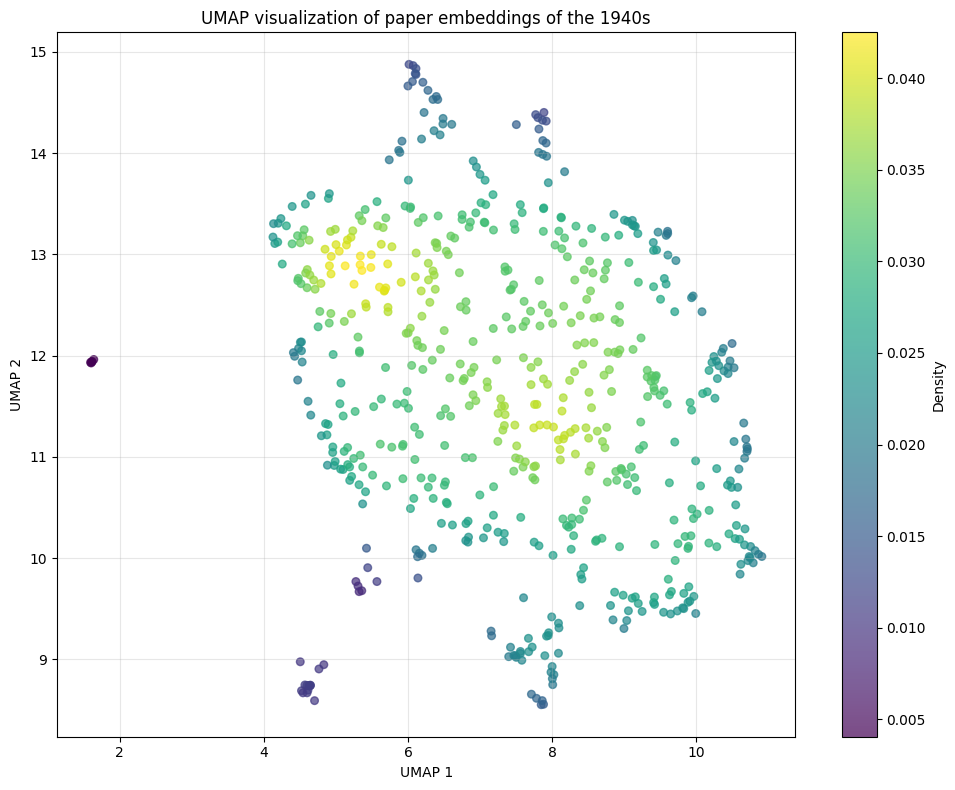

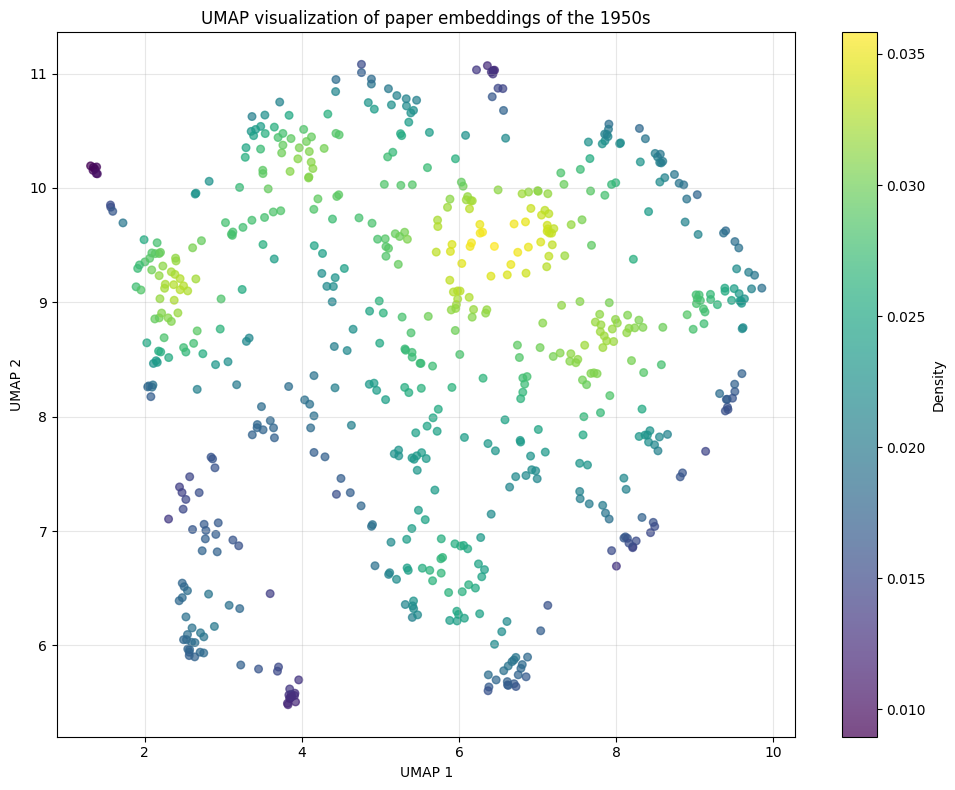

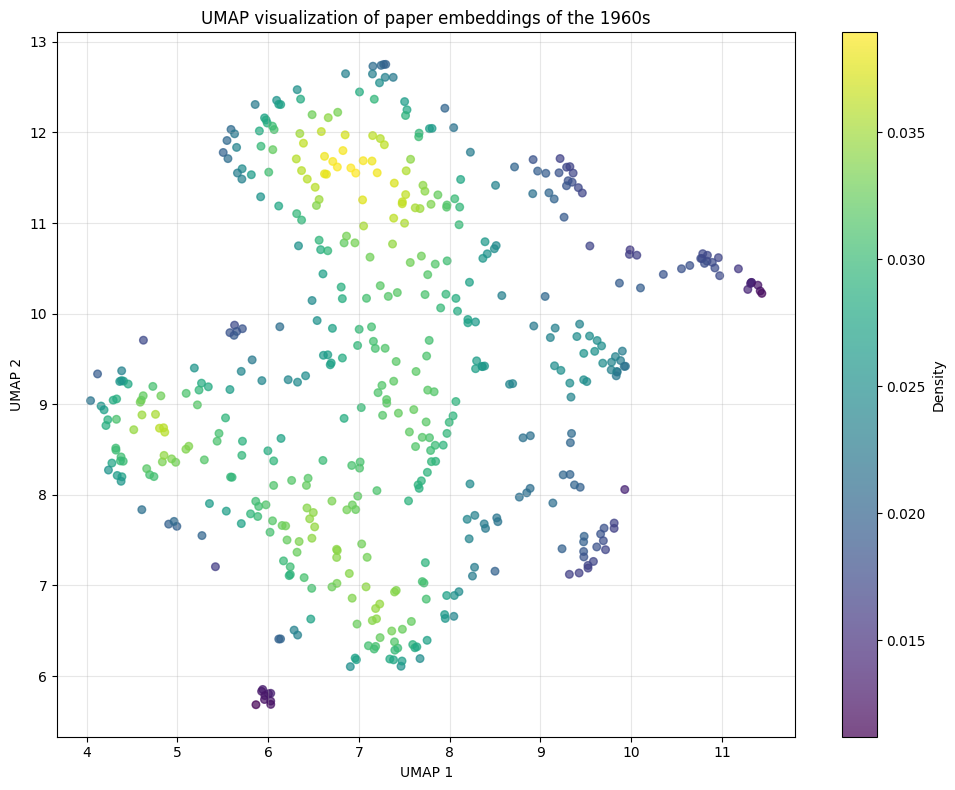

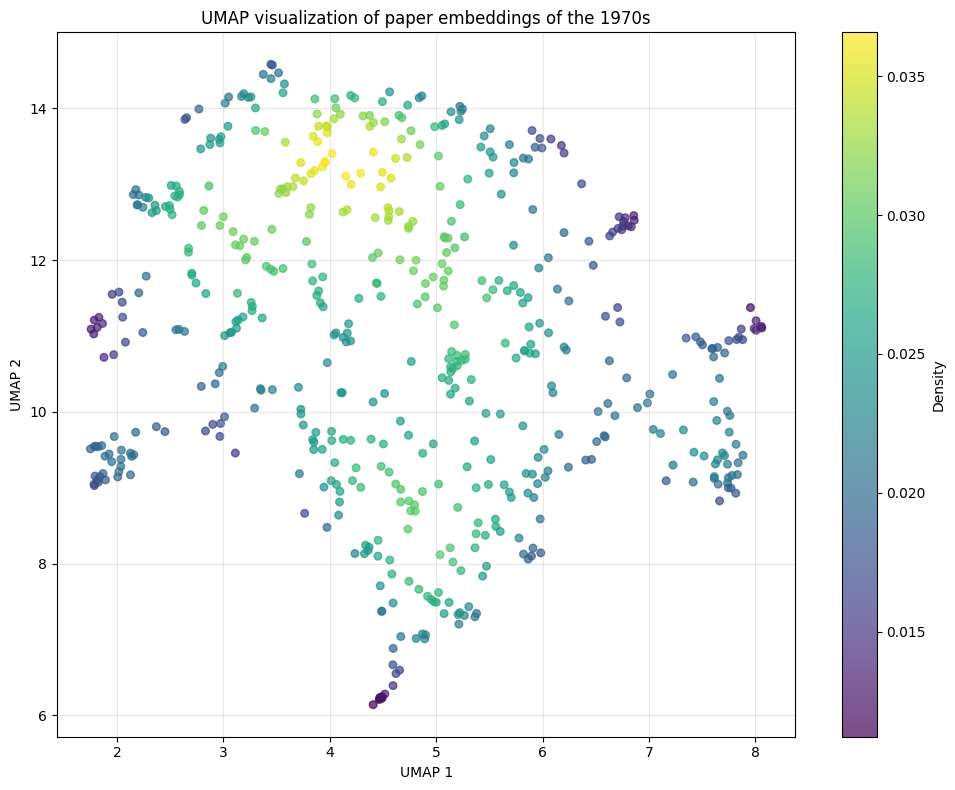

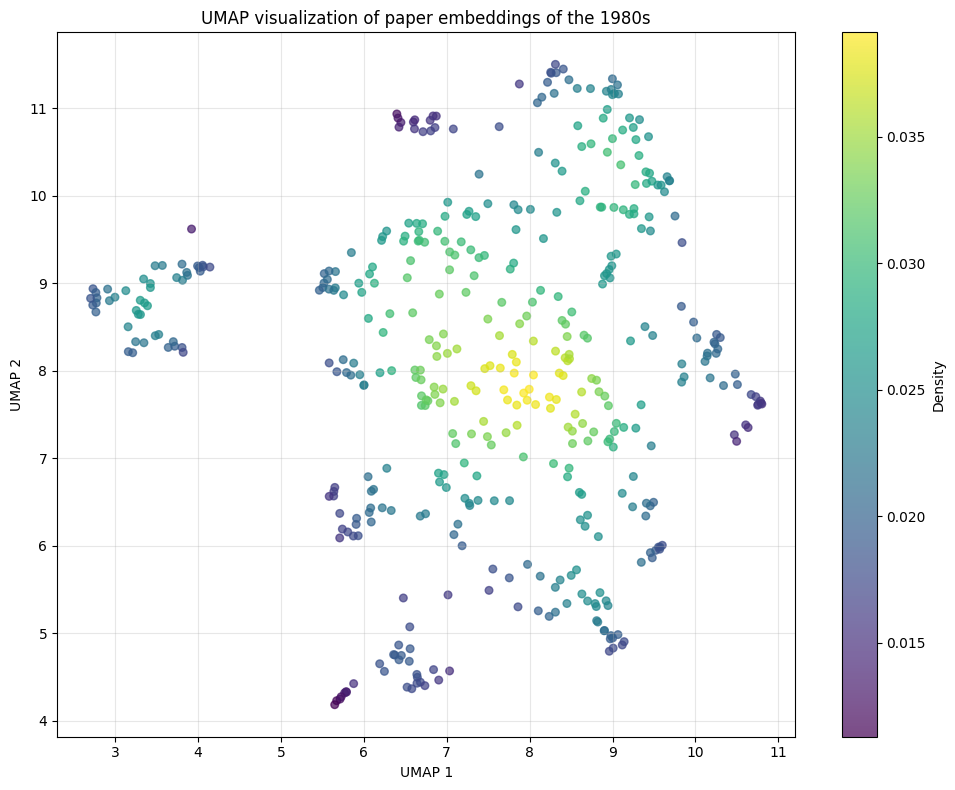

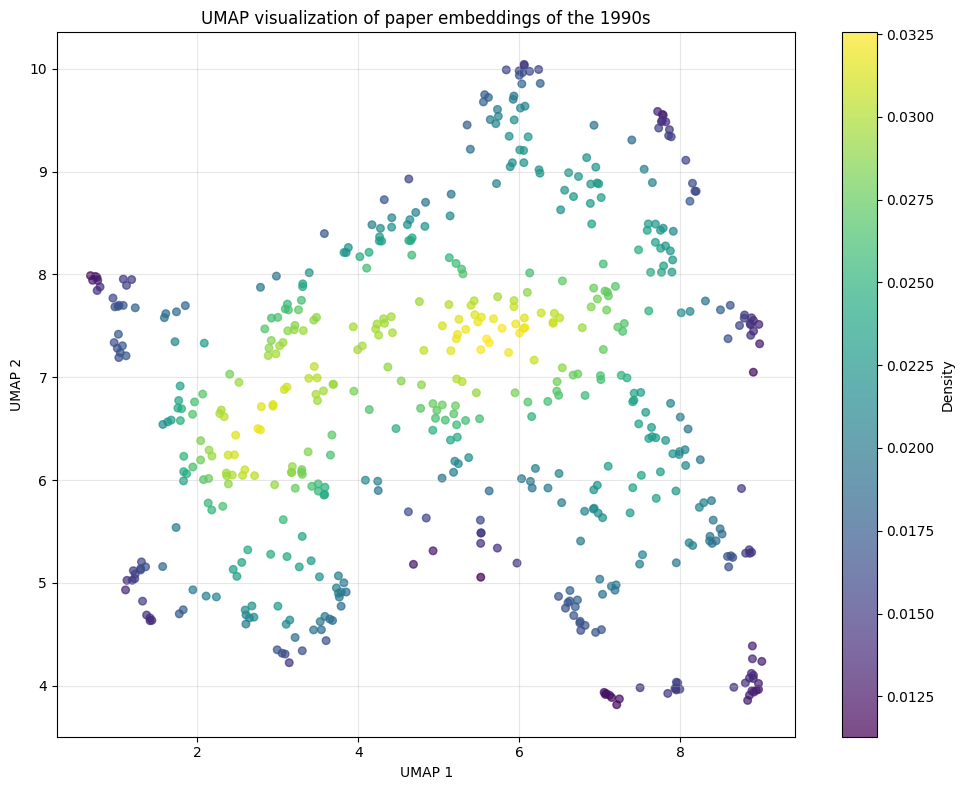

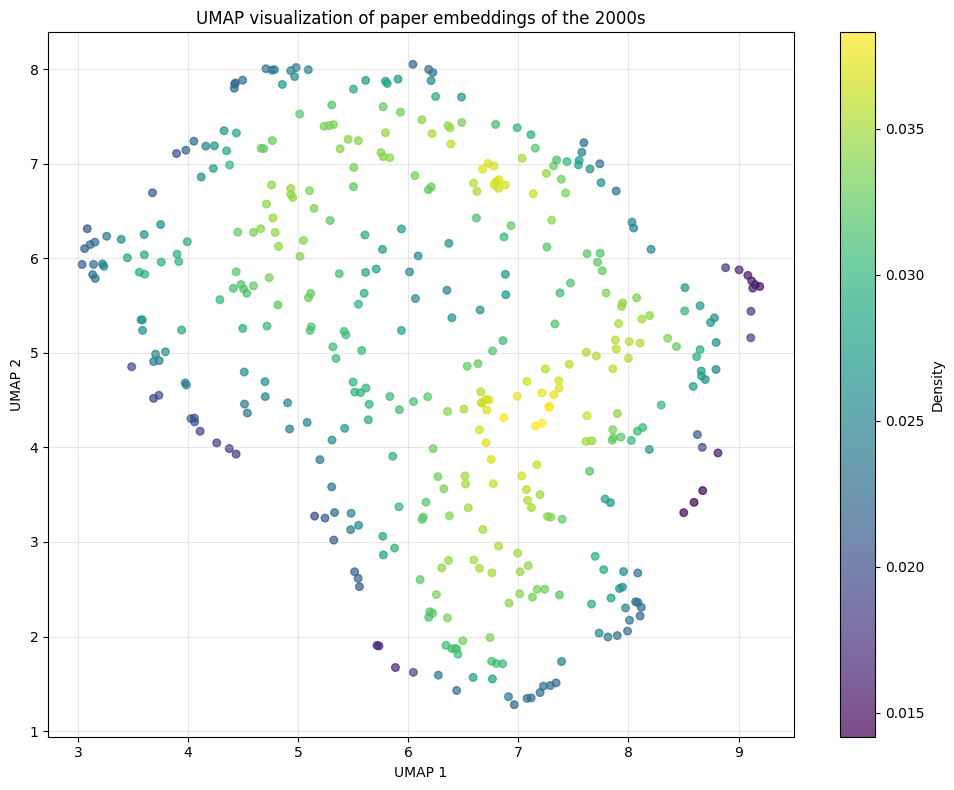

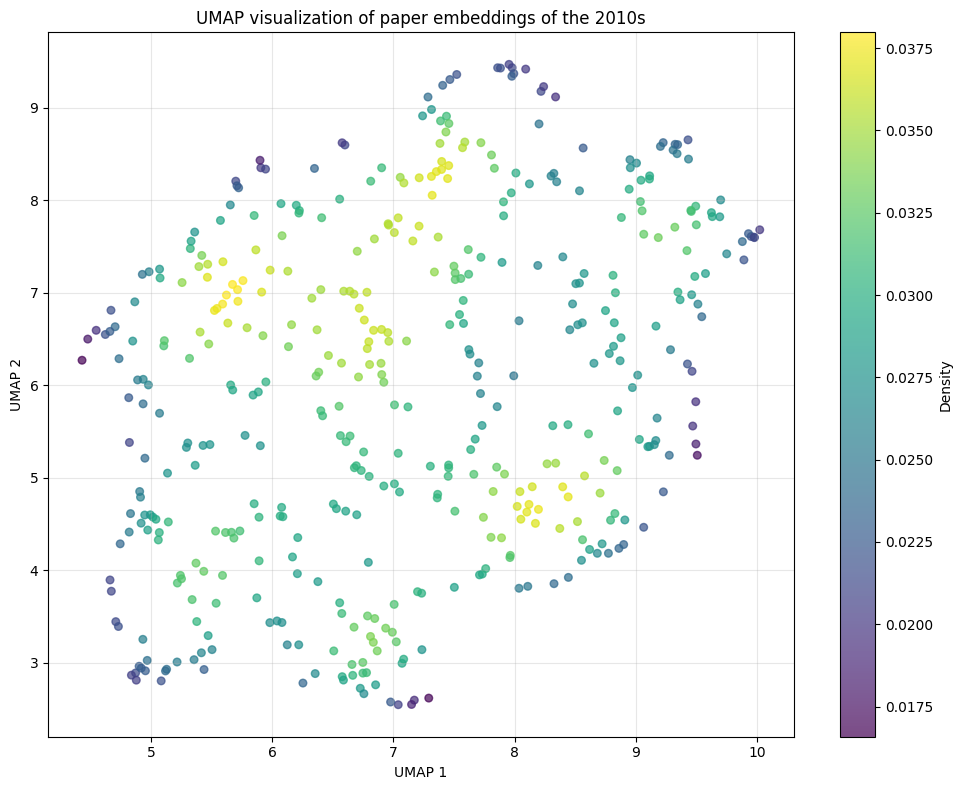

In [83]:
for key, value in asr_decades_gemini_embeddings_ave.items():
    visualize_embeddings_umap(value, key)

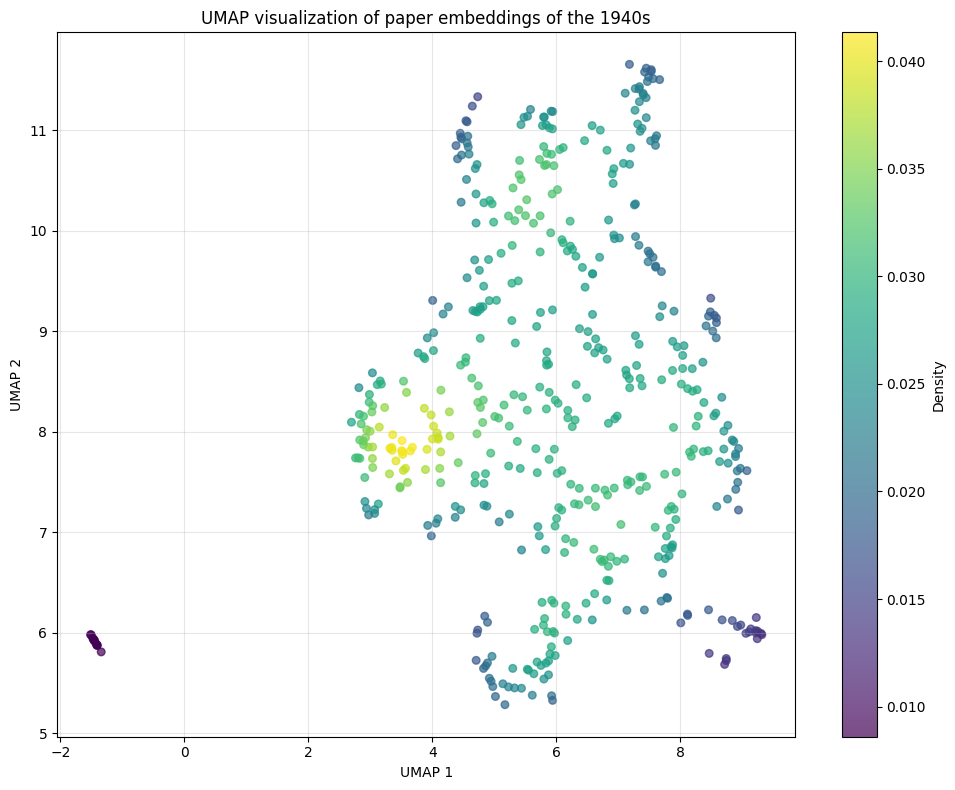

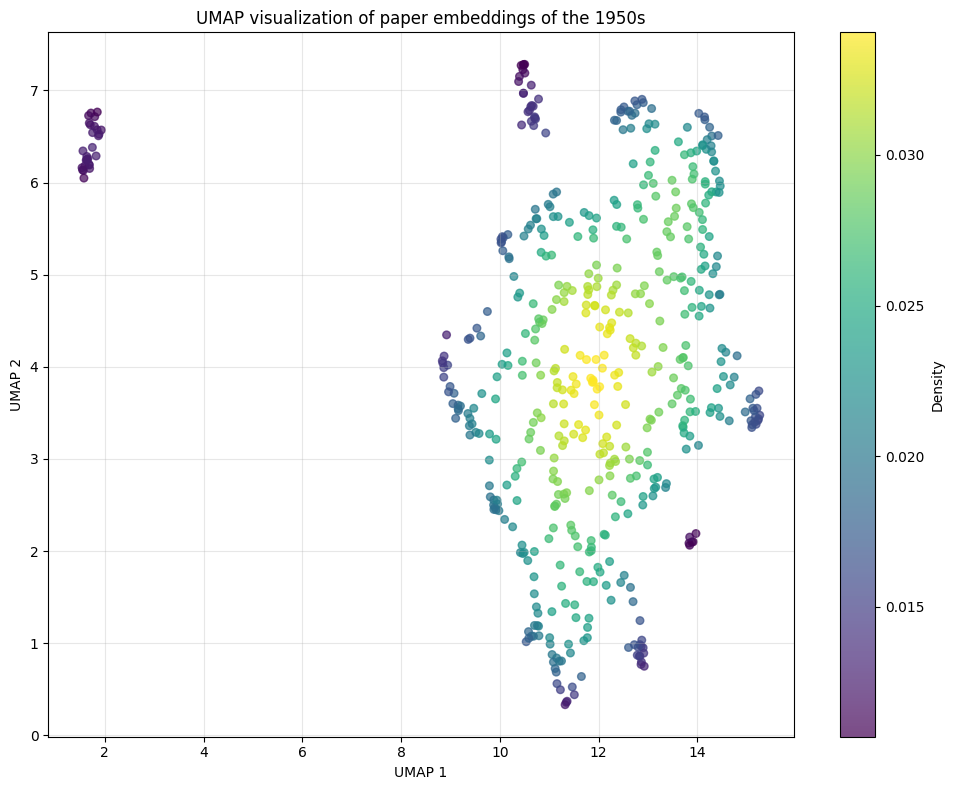

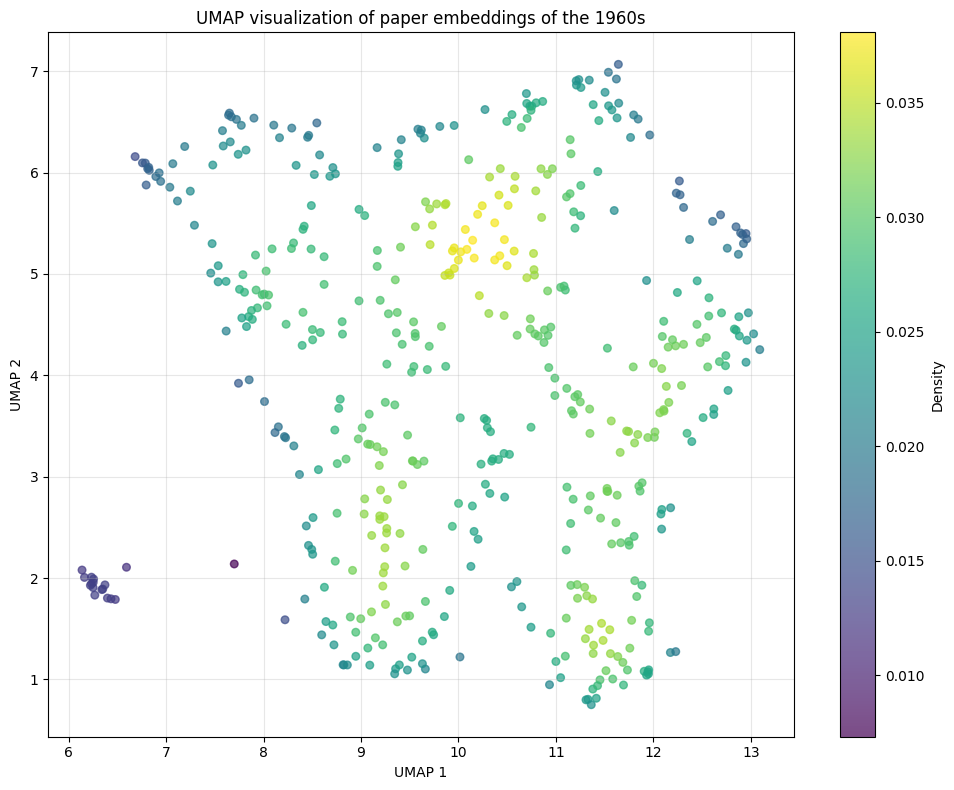

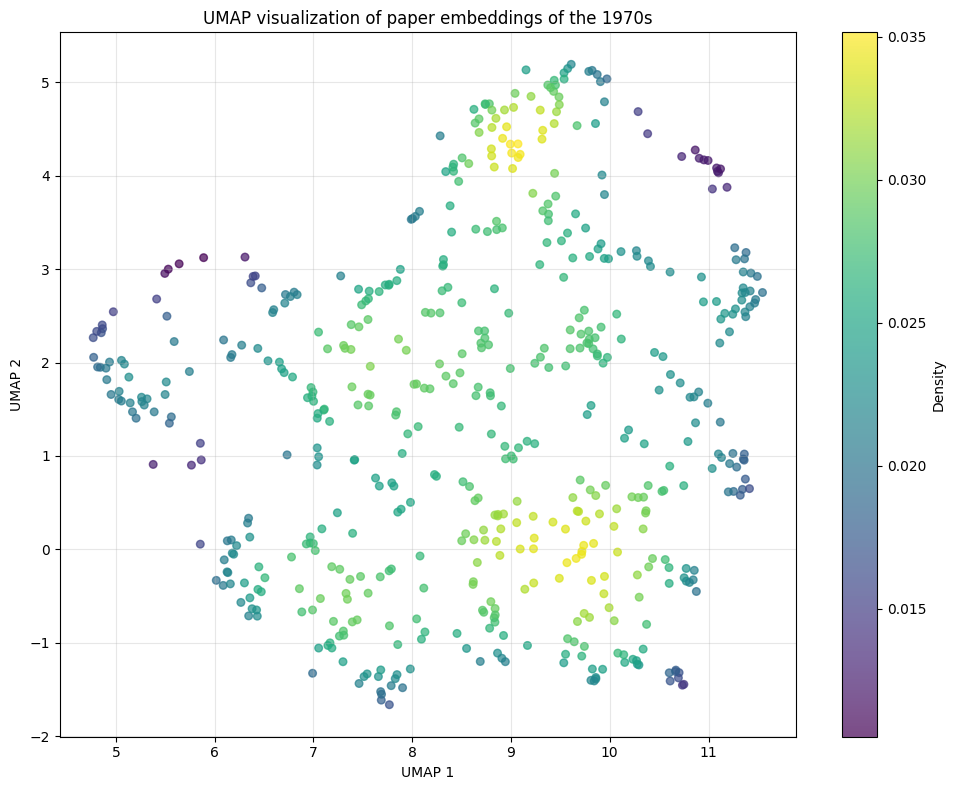

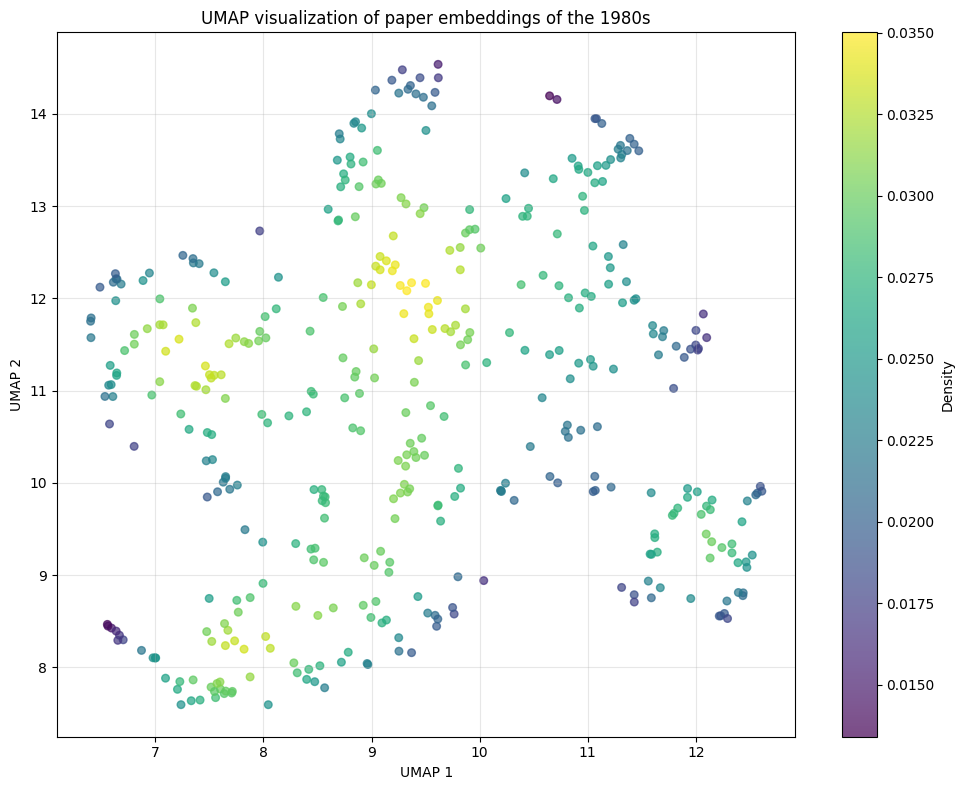

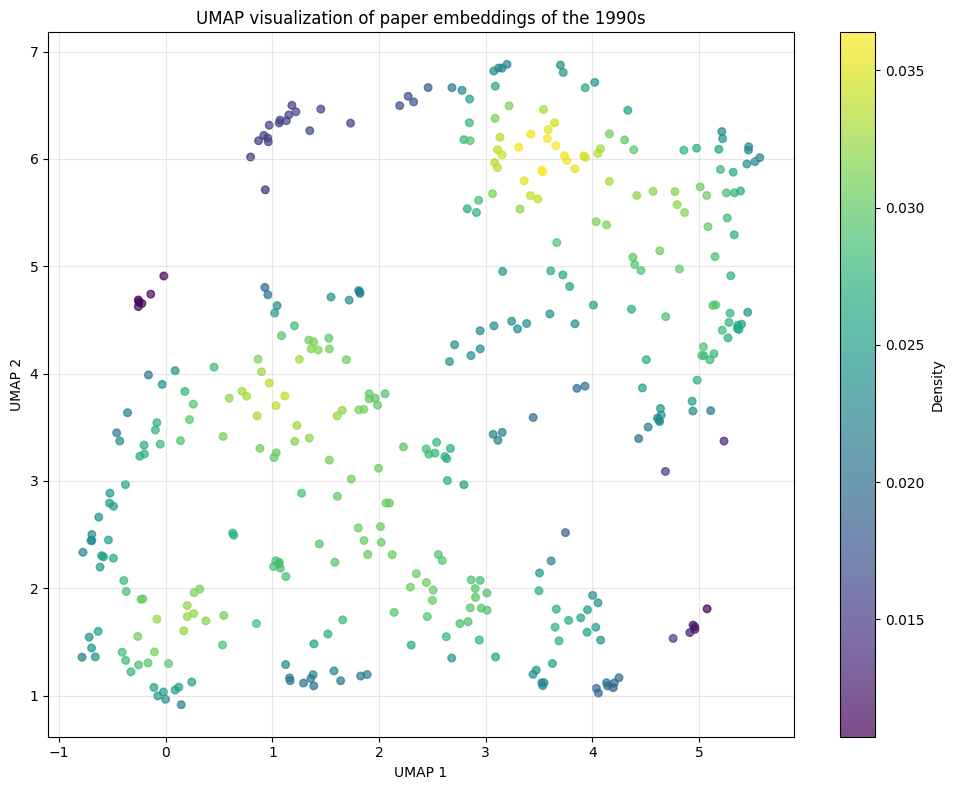

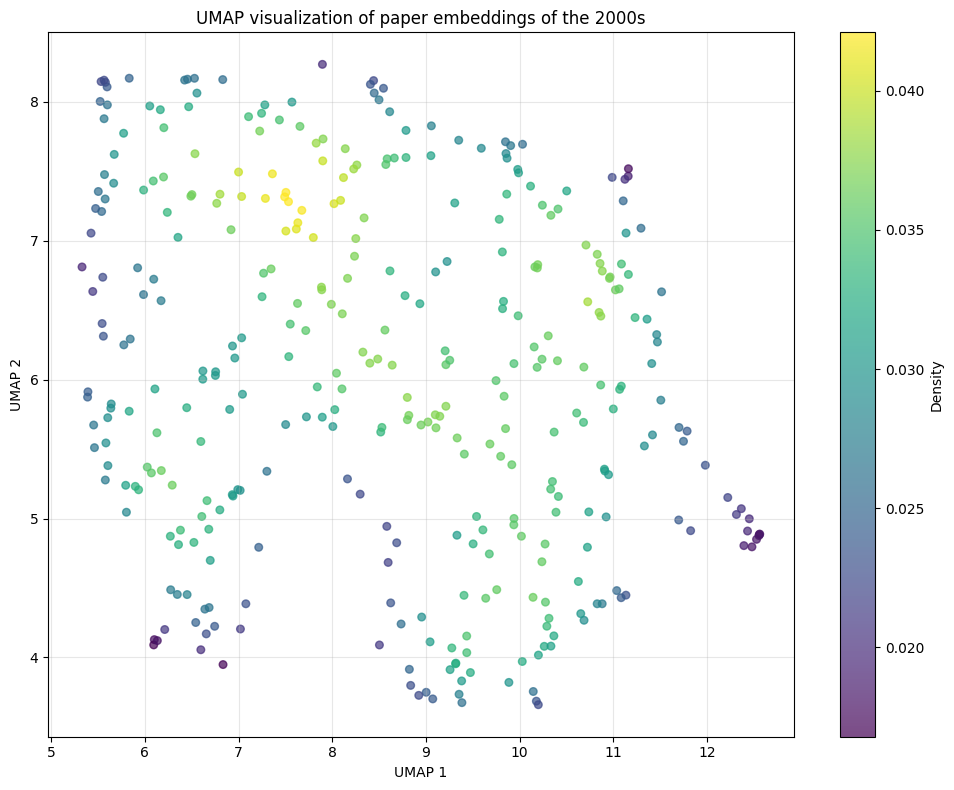

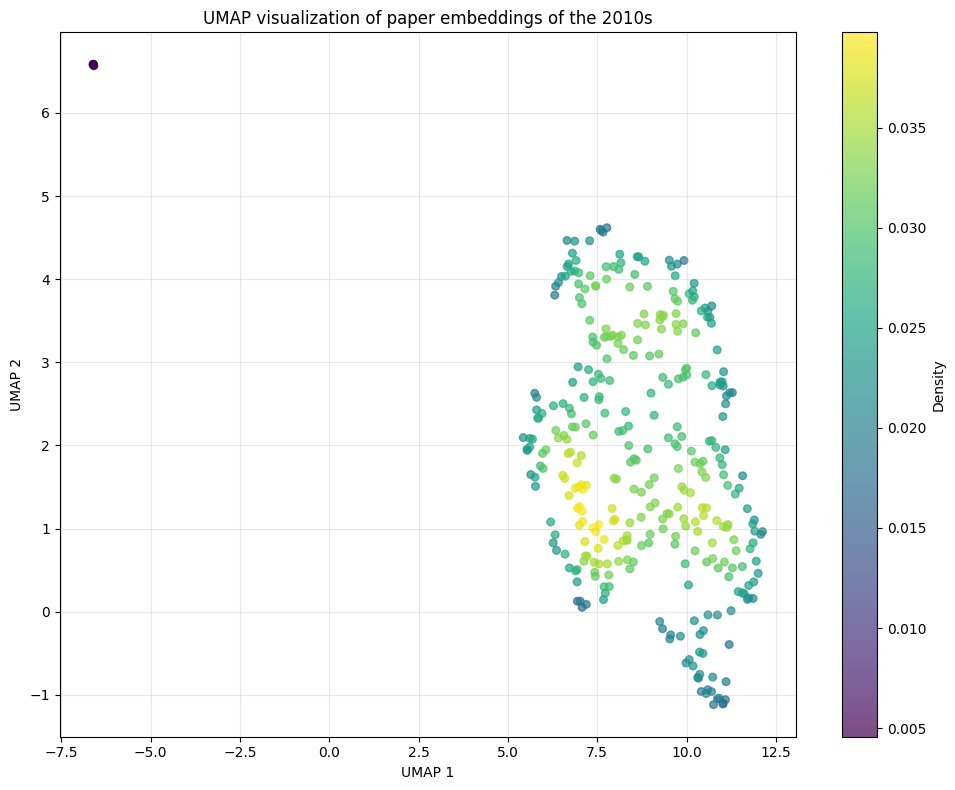

In [51]:
for key, value in ajs_decades_gemini_embeddings_ave.items():
    visualize_embeddings_umap(value, key)

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from umap import UMAP
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D

def visualize_decade_embeddings(decade_embeddings_dict, random_state=42, n_neighbors=25, min_dist=0.1):

    all_embeddings = []
    decade_labels = []

    for decade, embeddings in decade_embeddings_dict.items():
        all_embeddings.extend(embeddings)
        decade_labels.extend([decade] * len(embeddings))

    all_embeddings = np.array(all_embeddings)

    print(f"Fitting UMAP on {len(all_embeddings)} embeddings...")
    umap_reducer = UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric='cosine',
        random_state=random_state
    )

    embeddings_2d = umap_reducer.fit_transform(all_embeddings)

    umap_data = pd.DataFrame({
        'UMAP1': embeddings_2d[:, 0],
        'UMAP2': embeddings_2d[:, 1],
        'Decade': decade_labels
    })

    fig, ax = plt.subplots(figsize=(14, 10))

    cmap = LinearSegmentedColormap.from_list(
        "decade_colors",
        ["#0000FF", "#5577FF", "#77AAFF", "#AADDFF", "#FFDD99", "#FFAA66", "#FF5533", "#FF0000"]
    )

    unique_decades = sorted(decade_embeddings_dict.keys())

    norm_decades = {decade: (i / (len(unique_decades) - 1)) for i, decade in enumerate(unique_decades)}

    for decade in unique_decades:
        decade_data = umap_data[umap_data['Decade'] == decade]
        ax.scatter(
            decade_data['UMAP1'],
            decade_data['UMAP2'],
            c=[cmap(norm_decades[decade])] * len(decade_data),
            label=f"{decade}s",
            alpha=0.7,
            s=30,
            edgecolors='none'
        )

    legend_elements = [
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor=cmap(norm_decades[decade]),
               markersize=10, label=f"{decade}s")
        for decade in unique_decades
    ]
    ax.legend(handles=legend_elements, loc='upper right', title="Decades", frameon=True)
    ax.set_xlabel('UMAP Dimension 1', fontsize=14)
    ax.set_ylabel('UMAP Dimension 2', fontsize=14)

    plt.tight_layout()
    print("Statistics by decade:")
    for decade in unique_decades:
        count = len(decade_embeddings_dict[decade])
        print(f"{decade}s: {count} embeddings")

    return fig, umap_data

Fitting UMAP on 4181 embeddings...
Statistics by decade:
1940s: 620 embeddings
1950s: 634 embeddings
1960s: 490 embeddings
1970s: 556 embeddings
1980s: 455 embeddings
1990s: 556 embeddings
2000s: 417 embeddings
2010s: 453 embeddings


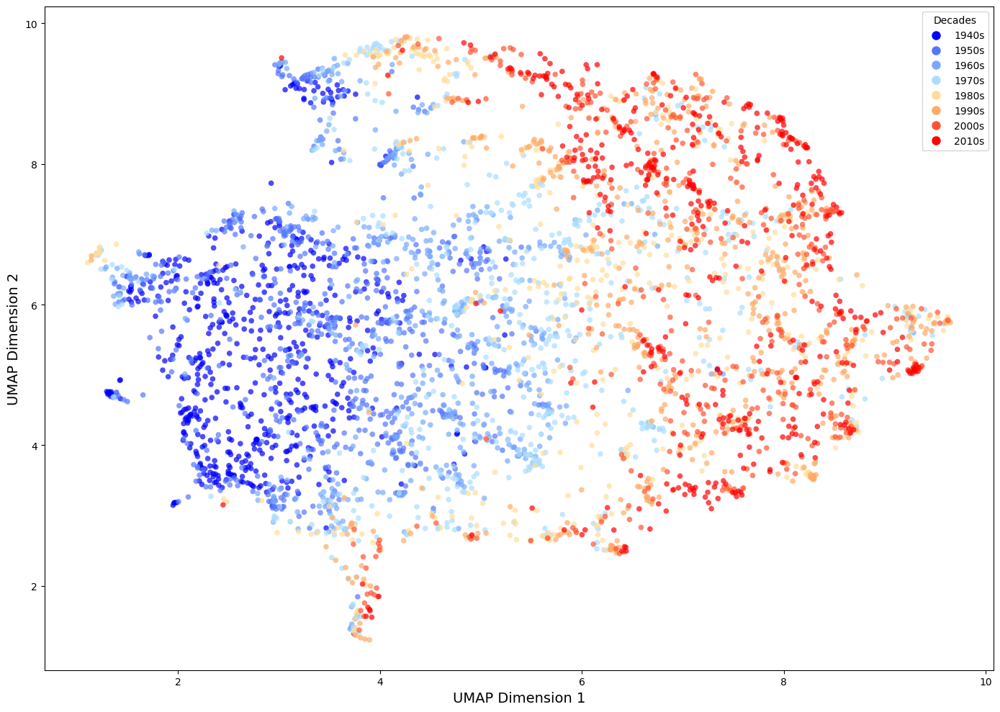

In [91]:
fig, umap_data = visualize_decade_embeddings(asr_decades_gemini_embeddings_ave)
plt.show()

Fitting UMAP on 3620 embeddings...
Statistics by decade:
1940s: 505 embeddings
1950s: 537 embeddings
1960s: 498 embeddings
1970s: 565 embeddings
1980s: 423 embeddings
1990s: 383 embeddings
2000s: 361 embeddings
2010s: 348 embeddings


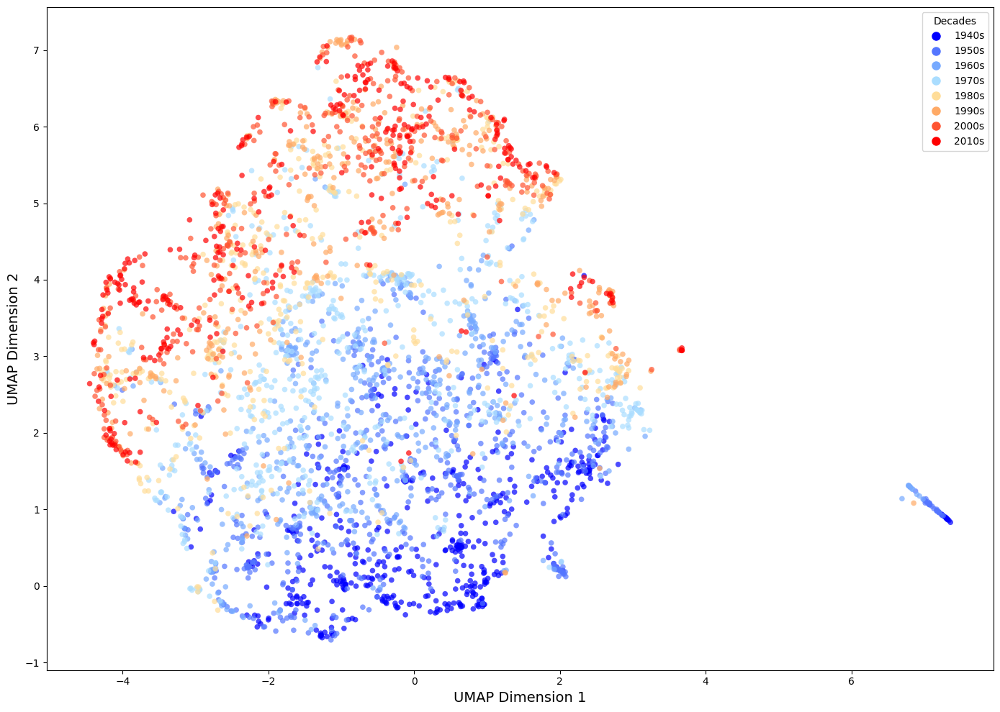

In [92]:
fig, umap_data = visualize_decade_embeddings(ajs_decades_gemini_embeddings_ave)
plt.show()

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from umap import UMAP
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D

def visualize_selected_decade_embeddings(decade_embeddings_dict,
                                        decades_to_plot=[1940, 1950, 2000, 2010],
                                        random_state=42,
                                        n_neighbors=25,
                                        min_dist=0.1):
    filtered_dict = {decade: embeddings for decade, embeddings in decade_embeddings_dict.items()
                    if decade in decades_to_plot}

    if not filtered_dict:
        raise ValueError(f"None of the specified decades {decades_to_plot} found in the data")

    all_embeddings = []
    decade_labels = []

    for decade, embeddings in filtered_dict.items():
        all_embeddings.extend(embeddings)
        decade_labels.extend([decade] * len(embeddings))

    all_embeddings = np.array(all_embeddings)

    print(f"Fitting UMAP on {len(all_embeddings)} embeddings from decades: {sorted(filtered_dict.keys())}")
    umap_reducer = UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric='cosine',
        random_state=random_state
    )

    embeddings_2d = umap_reducer.fit_transform(all_embeddings)

    umap_data = pd.DataFrame({
        'UMAP1': embeddings_2d[:, 0],
        'UMAP2': embeddings_2d[:, 1],
        'Decade': decade_labels
    })

    fig, ax = plt.subplots(figsize=(14, 10))
    decade_colors = {
        1940: '#0000FF',  # Dark blue
        1950: '#5577FF',  # Medium blue
        2000: '#FF7733',  # Orange
        2010: '#FF0000'   # Red
    }

    unique_decades = sorted(filtered_dict.keys())

    for decade in unique_decades:
        decade_data = umap_data[umap_data['Decade'] == decade]
        ax.scatter(
            decade_data['UMAP1'],
            decade_data['UMAP2'],
            c=decade_colors[decade],
            label=f"{decade}s",
            alpha=0.7,
            s=40,
            edgecolors='none'
        )

    ax.legend(loc='upper right', title="Decades", frameon=True, fontsize=12)
    ax.set_xlabel('UMAP Dimension 1', fontsize=14)
    ax.set_ylabel('UMAP Dimension 2', fontsize=14)
    plt.tight_layout()

    print("Statistics by decade:")
    for decade in unique_decades:
        count = len(filtered_dict[decade])
        print(f"{decade}s: {count} embeddings")

    return fig, umap_data


Fitting UMAP on 2124 embeddings from decades: [1940, 1950, 2000, 2010]
Statistics by decade:
1940s: 620 embeddings
1950s: 634 embeddings
2000s: 417 embeddings
2010s: 453 embeddings


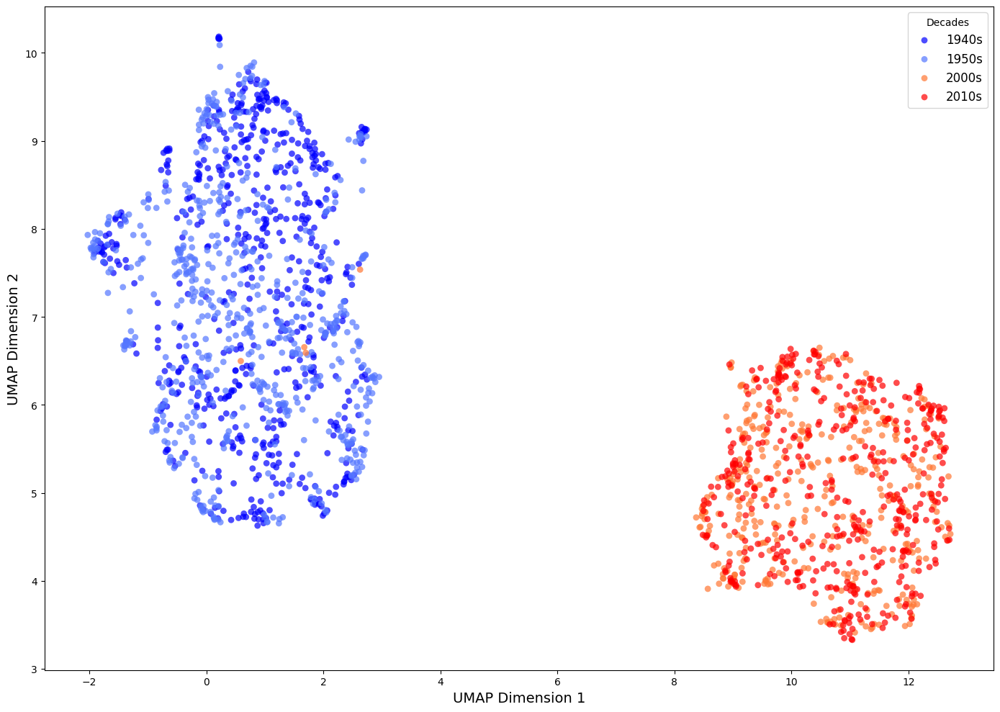

In [94]:
fig, umap_data = visualize_selected_decade_embeddings(asr_decades_gemini_embeddings_ave)
plt.show()

Fitting UMAP on 1751 embeddings from decades: [1940, 1950, 2000, 2010]
Statistics by decade:
1940s: 505 embeddings
1950s: 537 embeddings
2000s: 361 embeddings
2010s: 348 embeddings


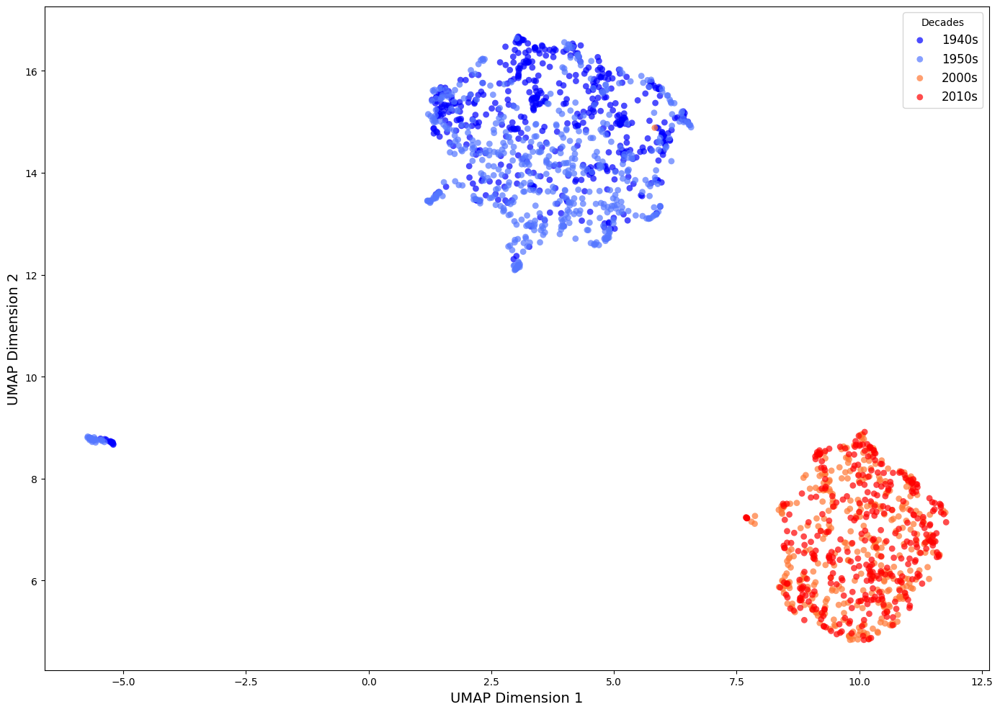

In [95]:
fig, umap_data = visualize_selected_decade_embeddings(ajs_decades_gemini_embeddings_ave)
plt.show()

## (BERTopic)

In [ ]:
from bertopic import BERTopic
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer

def bertopic_modeling(texts):

    vectorizer = CountVectorizer(
        stop_words="english",
        min_df=0.005,
        max_df=0.7,
        ngram_range=(1, 2),
        max_features=15000
    )

    embedding_model = SentenceTransformer('all-mpnet-base-v2')

    umap_model = UMAP(
        n_neighbors=25,
        n_components=8,
        min_dist=0.05,
        metric='cosine',
        random_state=42
    )

    hdbscan_model = HDBSCAN(
        min_cluster_size=20,
        min_samples=5,
        metric='euclidean',
        cluster_selection_method='eom',
        prediction_data=True,
    )

    topic_model = BERTopic(
        embedding_model=embedding_model,
        vectorizer_model=vectorizer,
        umap_model=umap_model,
        hdbscan_model=hdbscan_model,
        min_topic_size=20,
        nr_topics=None,
        top_n_words=15,
        calculate_probabilities=True,
        verbose=True
    )

    topics, probs = topic_model.fit_transform(texts)

    return topic_model, topics, probs

In [ ]:
asr_decades_bertopic_models_bychunk = {}
for key, value in asr_decades_chunks_noave.items():
    asr_decades_bertopic_models_bychunk[key] = bertopic_modeling(value)
    print(f"Processed decade {key}")

In [ ]:
ajs_decades_bertopic_models_bychunk = {}
for key, value in ajs_decades_chunks_noave.items():
    ajs_decades_bertopic_models_bychunk[key] = bertopic_modeling(value)
    print(f"Processed decade {key}")

2025-04-22 04:54:11,313 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/181 [00:00<?, ?it/s]

2025-04-22 04:56:34,298 - BERTopic - Embedding - Completed ✓
2025-04-22 04:56:34,298 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 04:56:52,501 - BERTopic - Dimensionality - Completed ✓
2025-04-22 04:56:52,503 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 04:56:54,913 - BERTopic - Cluster - Completed ✓
2025-04-22 04:56:54,923 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 04:57:01,274 - BERTopic - Representation - Completed ✓


Processed decade 1940


2025-04-22 04:57:04,528 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/190 [00:00<?, ?it/s]

2025-04-22 04:59:34,028 - BERTopic - Embedding - Completed ✓
2025-04-22 04:59:34,029 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 04:59:52,919 - BERTopic - Dimensionality - Completed ✓
2025-04-22 04:59:52,921 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 04:59:55,437 - BERTopic - Cluster - Completed ✓
2025-04-22 04:59:55,442 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:00:01,885 - BERTopic - Representation - Completed ✓


Processed decade 1950


2025-04-22 05:00:05,942 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/194 [00:00<?, ?it/s]

2025-04-22 05:02:39,129 - BERTopic - Embedding - Completed ✓
2025-04-22 05:02:39,130 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:02:57,871 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:02:57,872 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:03:01,695 - BERTopic - Cluster - Completed ✓
2025-04-22 05:03:01,703 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:03:08,315 - BERTopic - Representation - Completed ✓


Processed decade 1960


2025-04-22 05:03:11,746 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/268 [00:00<?, ?it/s]

2025-04-22 05:06:43,795 - BERTopic - Embedding - Completed ✓
2025-04-22 05:06:43,796 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:07:11,596 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:07:11,598 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:07:21,619 - BERTopic - Cluster - Completed ✓
2025-04-22 05:07:21,626 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:07:31,084 - BERTopic - Representation - Completed ✓


Processed decade 1970


2025-04-22 05:07:35,577 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/261 [00:00<?, ?it/s]

2025-04-22 05:11:02,989 - BERTopic - Embedding - Completed ✓
2025-04-22 05:11:02,990 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:11:29,114 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:11:29,115 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:11:42,162 - BERTopic - Cluster - Completed ✓
2025-04-22 05:11:42,169 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:11:49,885 - BERTopic - Representation - Completed ✓


Processed decade 1980


2025-04-22 05:11:56,014 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/299 [00:00<?, ?it/s]

2025-04-22 05:15:54,271 - BERTopic - Embedding - Completed ✓
2025-04-22 05:15:54,272 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:16:24,206 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:16:24,207 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:16:40,087 - BERTopic - Cluster - Completed ✓
2025-04-22 05:16:40,094 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:16:50,337 - BERTopic - Representation - Completed ✓


Processed decade 1990


2025-04-22 05:16:56,417 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/325 [00:00<?, ?it/s]

2025-04-22 05:21:16,269 - BERTopic - Embedding - Completed ✓
2025-04-22 05:21:16,269 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:21:33,468 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:21:33,470 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:21:58,214 - BERTopic - Cluster - Completed ✓
2025-04-22 05:21:58,221 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:22:09,689 - BERTopic - Representation - Completed ✓


Processed decade 2000


2025-04-22 05:22:17,177 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/341 [00:00<?, ?it/s]

2025-04-22 05:26:49,744 - BERTopic - Embedding - Completed ✓
2025-04-22 05:26:49,746 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-22 05:27:06,615 - BERTopic - Dimensionality - Completed ✓
2025-04-22 05:27:06,616 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-22 05:27:33,648 - BERTopic - Cluster - Completed ✓
2025-04-22 05:27:33,656 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-22 05:27:46,009 - BERTopic - Representation - Completed ✓


Processed decade 2010


In [ ]:
pkl_file_path = "/content/drive/My Drive/asr_decades_bertopic_models_bychunk.pkl"
with open(pkl_file_path, "wb") as f:
    pickle.dump(asr_decades_bertopic_models_bychunk, f)

In [ ]:
pkl_file_path = "/content/drive/My Drive/ajs_decades_bertopic_models_bychunk.pkl"
with open(pkl_file_path, "wb") as f:
    pickle.dump(ajs_decades_bertopic_models_bychunk, f)

In [ ]:
pkl_file_path = "/content/drive/My Drive/asr_decades_bertopic_models_bychunk.pkl"
with open(pkl_file_path, "rb") as f:
    asr_decades_bertopic_models_bychunk = pickle.load(f)

In [ ]:
pkl_file_path = "/content/drive/My Drive/ajs_decades_bertopic_models_bychunk.pkl"
with open(pkl_file_path, "rb") as f:
    ajs_decades_bertopic_models_bychunk = pickle.load(f)

In [ ]:
for key, value in asr_decades_bertopic_models_bychunk.items():
    print(f"Decade: {key}")
    info = value[0].get_topic_info()
    print(info)

Decade: 1940
     Topic  Count                                               Name  \
0       -1   1567                        -1_easter_wife_boy_families   
1        0    154                0_soviet_party_russian_soviet union   
2        1    150                 1_housing_room_unattached_families   
3        2    143       2_prestige_positions_struggle_class struggle   
4        3    128  3_sociologist_public welfare_social workers_we...   
..     ...    ...                                                ...   
108    107     20  107_social control_usages_social organization_...   
109    108     20              108_geopolitics_geography_raum_region   
110    109     20        109_class women_vocational_world war_sexual   
111    110     20                110_subjects_outlets_authors_kinsey   
112    111     20     111_partners_marriage_auxiliary_psychodramatic   

                                        Representation  \
0    [easter, wife, boy, families, child, rationing...   
1    [

In [ ]:
for key, value in asr_decades_bertopic_models_bychunk.items():
    print(f"Decade: {key}")
    figure = value[0].visualize_hierarchy()
    figure.show()

Decade: 1940


Decade: 1950


Decade: 1960


Decade: 1970


Decade: 1980


Decade: 1990


Decade: 2000


Decade: 2010


In [ ]:
for key, value in asr_decades_bertopic_models_bychunk.items():
    print(f"Decade: {key}")
    figure = value[0].visualize_heatmap()
    figure.show()

Decade: 1940


Decade: 1950


Decade: 1960


Decade: 1970


Decade: 1980


Decade: 1990


Decade: 2000


Decade: 2010


In [ ]:
for key, value in ajs_decades_bertopic_models_bychunk.items():
    print(f"Decade: {key}")
    info = value[0].get_topic_info()
    print(info)

Decade: 1940
    Topic  Count                                       Name  \
0      -1   1217             -1_child_sociology_negro_force   
1       0    276            0_birth_fertility_rates_married   
2       1    158  1_college_chicago_columbia_north carolina   
3       2    132               2_urban_cities_suburbs_rural   
4       3    123              3_peace_wars_warfare_fighting   
..    ...    ...                                        ...   
90     89     21                          89_nr_der_und_die   
91     90     21       90_rental_homeownership_cities_rates   
92     91     20    91_sociability_sociable_content_reality   
93     92     20             92_serbia_croatian_serb_cvijic   
94     93     20    93_negro_scholar_scholars_negro scholar   

                                       Representation  \
0   [child, sociology, negro, force, london, cours...   
1   [birth, fertility, rates, married, birth rate,...   
2   [college, chicago, columbia, north carolina, 1...   
3 